## Understanding the business

- **date**: The date of the record.
- **sku**: SKU (Stock Keeping Unit) identifier.
- **network_name_hash**: A hashed representation of the network name.
- **region**: Geographical region.
- **days_after_install**: Days passed since the app was installed.
- **period**: Time period (in this case, it appears to be 'day' for all rows).
- **network_name**: Name of the network.
- **spend**: Amount spent.
- **cohort_size**: Size of the cohort.
- **organic_cohort_size**: Size of the organic cohort.
- **retained_users**: Number of users retained.
- **organic_retained_users**: Number of organic users retained.
- **revenue_ad**: Revenue from ads.
- **revenue_iap**: Revenue from in-app purchases.
- **revenue_sub**: Revenue from subscriptions.
- **organic_revenue_ad**: Organic revenue from ads.
- **organic_revenue_iap**: Organic revenue from in-app purchases.
- **organic_revenue_sub**: Organic revenue from subscriptions.

In [148]:
import math
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.graph_objs as go
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
from sklearn import preprocessing
from sklearn.preprocessing import PowerTransformer, QuantileTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


In [149]:
data = pd.read_csv('sample_data_1_ofuscated.csv')
data.head()


,date,sku,network_name_hash,region,days_after_install,period,network_name,spend,cohort_size,organic_cohort_size,retained_users,organic_retained_users,revenue_ad,revenue_iap,revenue_sub,organic_revenue_ad,organic_revenue_iap,organic_revenue_sub
0,2021-08-12,App T (iOS),81880948,T2,82,day,Channel U,237.275169,226.0,306.573488,1.0,3.534988,0.0251,0.0,0.0,0.112073,0.000000,0.0
1,2023-04-16,App T (android),81880948,T1,27,day,Channel U,0.000000,250.0,56.848112,6.0,1.536435,5.7208,0.0,0.0,0.251103,0.273815,0.0
2,2021-02-20,App W (iOS),81880948,T3,93,day,Channel U,0.000000,84.0,18.809504,4.0,0.750178,0.0100,0.0,0.0,0.007861,0.000000,0.0
3,2022-09-06,App T (iOS),81880948,T2,50,day,Channel U,52.953013,41.0,68.579913,1.0,1.068800,0.0501,0.0,0.0,0.074565,0.000000,0.0
4,2023-01-17,App T (android),81880948,T1,17,day,Channel U,905.814500,730.0,120.056114,41.0,4.621583,3.7005,0.0,0.0,1.304274,0.000000,0.0


In [150]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51405 entries, 0 to 51404
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   date                    51405 non-null  object 
 1   sku                     51405 non-null  object 
 2   network_name_hash       51405 non-null  int64  
 3   region                  51405 non-null  object 
 4   days_after_install      51405 non-null  int64  
 5   period                  51405 non-null  object 
 6   network_name            51405 non-null  object 
 7   spend                   51405 non-null  float64
 8   cohort_size             51405 non-null  float64
 9   organic_cohort_size     51405 non-null  float64
 10  retained_users          51405 non-null  float64
 11  organic_retained_users  51405 non-null  float64
 12  revenue_ad              51405 non-null  float64
 13  revenue_iap             51405 non-null  float64
 14  revenue_sub             51405 non-null

In [151]:
data['network_name'].unique()

array(['Channel U', 'Channel A', 'Channel F'], dtype=object)

In [152]:
data.describe(include='all')

,date,sku,network_name_hash,region,days_after_install,period,network_name,spend,cohort_size,organic_cohort_size,retained_users,organic_retained_users,revenue_ad,revenue_iap,revenue_sub,organic_revenue_ad,organic_revenue_iap,organic_revenue_sub
count,51405,51405,5.140500e+04,51405,51405.000000,51405,51405,51405.000000,51405.000000,51405.000000,51405.000000,51405.000000,51405.000000,51405.000000,51405.000000,51405.000000,51405.000000,51405.000000
unique,947,4,NaN,5,NaN,2,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,2022-09-24,App T (iOS),NaN,T1,NaN,day,Channel F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,87,13040,NaN,10422,NaN,47374,17294,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,6.288966e+08,NaN,67.485225,NaN,NaN,656.475111,757.279584,279.280557,30.496333,13.994421,8.523013,2.533183,0.356349,3.583773,1.525728,0.121277
std,NaN,NaN,4.758837e+08,NaN,55.016218,NaN,NaN,2137.080091,2368.111730,628.945684,285.023445,89.025590,121.754191,30.073635,4.363706,47.777589,15.211318,1.764583
min,NaN,NaN,8.188095e+07,NaN,0.000000,NaN,NaN,0.000000,-2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,NaN,NaN,8.188095e+07,NaN,30.000000,NaN,NaN,0.000000,0.000000,5.875000,0.000000,0.125000,0.000000,0.000000,0.000000,0.000964,0.000000,0.000000
50%,NaN,NaN,5.617743e+08,NaN,60.000000,NaN,NaN,0.000000,47.000000,53.835555,1.000000,1.338605,0.000000,0.000000,0.000000,0.046275,0.000000,0.000000
75%,NaN,NaN,1.244348e+09,NaN,93.000000,NaN,NaN,212.598417,508.000000,267.887305,11.000000,8.561416,0.994600,0.000000,0.000000,0.660534,0.000000,0.000000


From the above statistics, we can see that:

- Many columns have a mean that's much higher than the median. This suggests that the data is skewed, with a few large values pulling the mean up.
- Many metrics have a median of $0, indicating that for at least half of the records, there was no spend, revenue, or user retention.


To get a clearer visual understanding, let's plot histograms for each of these columns.

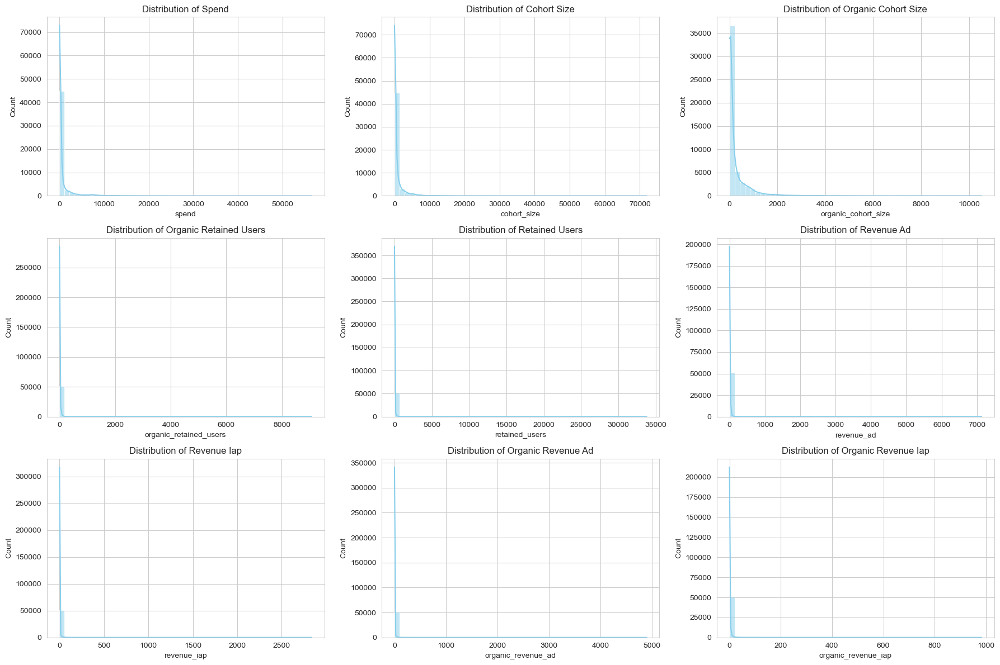

In [153]:

import matplotlib.pyplot as plt
import seaborn as sns

# Setting the style for the plots
sns.set_style('whitegrid')

# Columns to analyze
columns = ['spend', 'cohort_size', 'organic_cohort_size', 'organic_retained_users', 'retained_users', 'revenue_ad', 'revenue_iap', 'organic_revenue_ad', 'organic_revenue_iap']

# Titles for the plots
titles = []

for col in columns:
        titles.append('Distribution of ' + col.replace('_', ' ').title())


# Plotting histograms with log scale transformation
fig, axes = plt.subplots(3, 3, figsize=(18, 12))

for ax, col, title in zip(axes.ravel(), columns, titles):
    sns.histplot(data[col], bins=50, ax=ax, kde=True, color='skyblue', log_scale=False)
    ax.set_title(title)
    ax.set_ylabel('Count')
    
plt.tight_layout()
plt.show()
    

- **Spend**: The majority of records have a spend close to $0, and there's a long tail with a few records having significantly higher spends.
- **Cohort Size**: Most records have a smaller cohort size, but there are outliers with larger sizes.
- **Organic Cohort** Size: A similar pattern to the cohort size, with the majority of records having smaller organic cohort sizes.
- **Retained Users**: The majority of records have a low number of retained users, with a few having a significantly higher count.
- **Revenue from Ads**: Most records have revenue close to $0, with a long tail representing a few records with higher revenues.
- **Revenue from In-app Purchases**: A similar pattern to the revenue from ads.
- **Revenue from Subscriptions**: Most records have no subscription revenue, with a few exceptions.

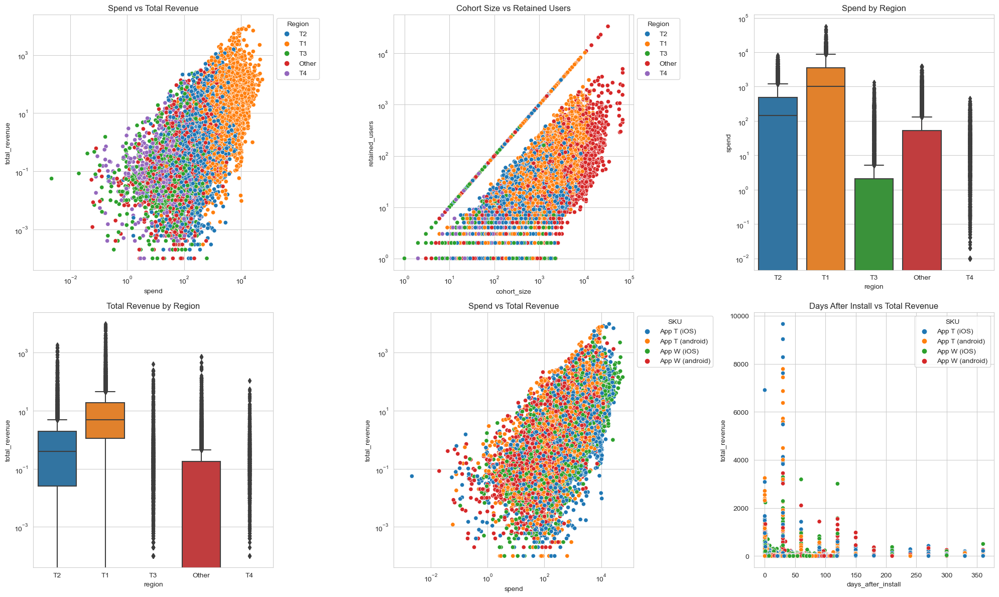

In [154]:

# Creating a 'total_revenue' column
data['total_revenue'] = data['revenue_ad'] + data['revenue_iap'] + data['revenue_sub']

# Multivariate plots
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# 1. Scatter plot for spend vs total revenue
sns.scatterplot(data=data, x='spend', y='total_revenue', hue='region', ax=axes[0, 0])
axes[0, 0].set_title('Spend vs Total Revenue')
axes[0, 0].set_xscale('log')
axes[0, 0].set_yscale('log')
axes[0, 0].legend(title='Region', bbox_to_anchor=(1, 1))

# 2. Scatter plot for cohort size vs retained users
sns.scatterplot(data=data, x='cohort_size', y='retained_users', hue='region', ax=axes[0, 1])
axes[0, 1].set_title('Cohort Size vs Retained Users')
axes[0, 1].set_xscale('log')
axes[0, 1].set_yscale('log')
axes[0, 1].legend(title='Region', bbox_to_anchor=(1, 1))

# 3. Box plot for spend by region
sns.boxplot(data=data, x='region', y='spend', ax=axes[0, 2])
axes[0, 2].set_title('Spend by Region')
axes[0, 2].set_yscale('log')

# 4. Box plot for total revenue by region
sns.boxplot(data=data, x='region', y='total_revenue', ax=axes[1, 0])
axes[1, 0].set_title('Total Revenue by Region')
axes[1, 0].set_yscale('log')

# 5. Scatter plot for spend vs total revenue
sns.scatterplot(data=data, x='spend', y='total_revenue', hue='sku', ax=axes[1, 1])
axes[1, 1].set_title('Spend vs Total Revenue')
axes[1, 1].set_xscale('log')
axes[1, 1].set_yscale('log')
axes[1, 1].legend(title='SKU', bbox_to_anchor=(1, 1))

# 6. Scatter plot for spend vs total revenue
sns.scatterplot(data=data, x='days_after_install', y='total_revenue', hue='sku', ax=axes[1, 2])
axes[1, 2].set_title('Days After Install vs Total Revenue')
# axes[1, 2].set_xscale('log')
# axes[1, 2].set_yscale('log')
axes[1, 2].legend(title='SKU', bbox_to_anchor=(1, 1))


plt.tight_layout()
plt.show()
    

- **Spend vs Total Revenue (by Region)**: There tends to be more spend (and revenue) on T1,T2 regions vs other regions.
- **Cohort Size vs Retained Users**: There are some interesting patterns here than need further investigation.
- **Spend by region** Other is top3 in spend, T4 doesn't get much spend - that's interesting.
- **Total Revenue by Region**: T1 and T2 at the top of the list - makes sense.
- **Spend vs Total Revenue (by SKU)**: No clear pattern here, needs more investigation.
- **Days After Install vs Total Revenue**: revenue drops over time.

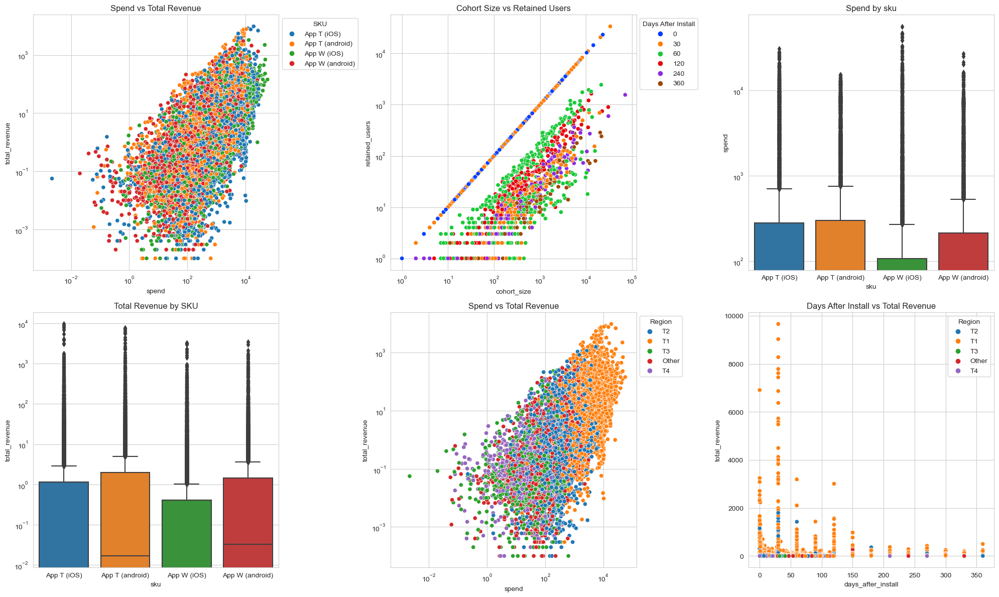

In [155]:

# Creating a 'total_revenue' column
data['total_revenue'] = data['revenue_ad'] + data['revenue_iap'] + data['revenue_sub']

# Multivariate plots
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# 1. Scatter plot for spend vs total revenue
sns.scatterplot(data=data, x='spend', y='total_revenue', hue='sku', ax=axes[0, 0])
axes[0, 0].set_title('Spend vs Total Revenue')
axes[0, 0].set_xscale('log')
axes[0, 0].set_yscale('log')
axes[0, 0].legend(title='SKU', bbox_to_anchor=(1, 1))

# 2. Scatter plot for cohort size vs retained users
palette_choice = sns.color_palette("bright")[0:6]
sns.scatterplot(data=data[data['days_after_install'].isin([0, 30, 60, 120, 240, 360])], x='cohort_size', y='retained_users', hue='days_after_install', ax=axes[0, 1], palette=palette_choice)
axes[0, 1].set_title('Cohort Size vs Retained Users')
axes[0, 1].set_xscale('log')
axes[0, 1].set_yscale('log')
axes[0, 1].legend(title='Days After Install', bbox_to_anchor=(1, 1))

# 3. Box plot for spend by region
sns.boxplot(data=data, x='sku', y='spend', ax=axes[0, 2])
axes[0, 2].set_title('Spend by sku')
axes[0, 2].set_yscale('log')

# 4. Box plot for total revenue by region
sns.boxplot(data=data, x='sku', y='total_revenue', ax=axes[1, 0])
axes[1, 0].set_title('Total Revenue by SKU')
axes[1, 0].set_yscale('log')

# 5. Scatter plot for spend vs total revenue
sns.scatterplot(data=data, x='spend', y='total_revenue', hue='region', ax=axes[1, 1])
axes[1, 1].set_title('Spend vs Total Revenue')
axes[1, 1].set_xscale('log')
axes[1, 1].set_yscale('log')
axes[1, 1].legend(title='Region', bbox_to_anchor=(1, 1))

# 6. Scatter plot for spend vs total revenue
sns.scatterplot(data=data, x='days_after_install', y='total_revenue', hue='region', ax=axes[1, 2])
axes[1, 2].set_title('Days After Install vs Total Revenue')
# axes[1, 2].set_xscale('log')
# axes[1, 2].set_yscale('log')
axes[1, 2].legend(title='Region', bbox_to_anchor=(1, 1))


plt.tight_layout()
plt.show()
    

- **Spend vs Total Revenue (by SKU)**: I was expecting to find a pattern here but it's not the case.
- **Cohort Size vs Retained Users (by days after install)**: The days_after_install dimension needs some work to actually be useful.
- **Spend by SKU** Aside from "App W (iOS)" the rest of the apps get very similar spend budgets.
- **Total Revenue by SKU**: "App W (iOS)" gives pretty good returns since the gap in revenue closed significantly (vs spend).
- **Spend vs Total Revenue (by region)**: We can see the same region trends as before.
- **Days After Install vs Total Revenue**: The T1 region clearly outperforms the other ones.

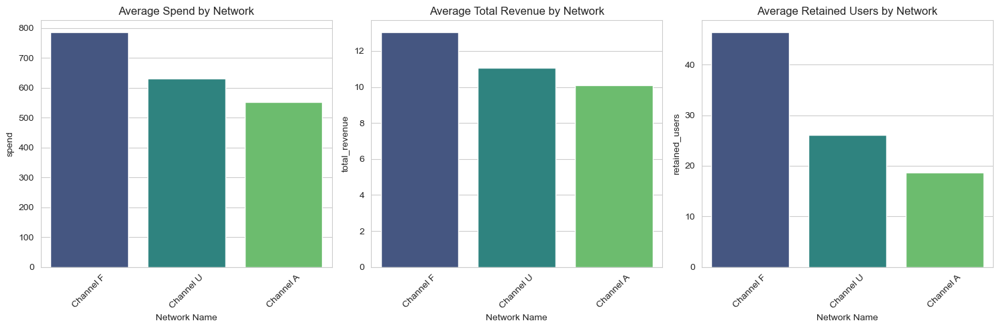

In [156]:

# Grouping data by 'network_name' and calculating the mean for selected metrics
network_grouped = data.groupby('network_name').agg({
    'spend': 'mean',
    'total_revenue': 'mean',
    'retained_users': 'mean'
}).reset_index()

# Sorting the dataframe by total revenue for better visualization
network_grouped = network_grouped.sort_values(by='total_revenue', ascending=False)

# Plotting the metrics by network
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Metrics and titles
metrics = ['spend', 'total_revenue', 'retained_users']
plot_titles = ['Average Spend by Network', 'Average Total Revenue by Network', 'Average Retained Users by Network']

for ax, metric, title in zip(axes, metrics, plot_titles):
    sns.barplot(x='network_name', y=metric, data=network_grouped, ax=ax, palette='viridis')
    ax.set_title(title)
    ax.set_ylabel(metric)
    ax.set_xlabel('Network Name')
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()
    

"Channel F" outperforms the other ones especially when it comes to retained users. That's probably the reason why it gets a bigger spend budget.

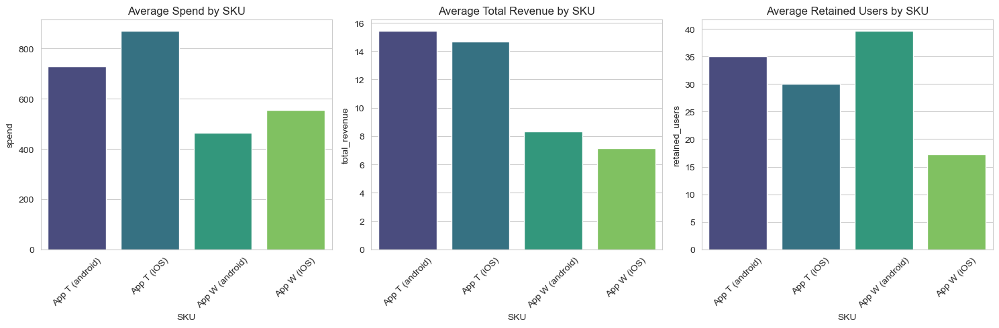

In [157]:

# Grouping data by 'sku' and calculating the mean for selected metrics
sku_grouped = data.groupby('sku').agg({
    'spend': 'mean',
    'total_revenue': 'mean',
    'retained_users': 'mean'
}).reset_index()

# Sorting the dataframe by total revenue for better visualization
sku_grouped = sku_grouped.sort_values(by='total_revenue', ascending=False)

# Plotting the metrics by sku
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for ax, metric, title in zip(axes, metrics, plot_titles):
    sns.barplot(x='sku', y=metric, data=sku_grouped, ax=ax, palette='viridis')
    ax.set_title(title.replace("Network", "SKU"))
    ax.set_ylabel(metric)
    ax.set_xlabel('SKU')
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()
    

"App T (android)" comes at the top but its iOS counterpart is quite close - although the android app gets less spend budget. "App W (android)" retains much better than the rest although it doesn't monetize as good as the others.

In [158]:

# Creating the 'total_organic_revenue' column
data['total_organic_revenue'] = data['organic_revenue_ad'] + data['organic_revenue_iap'] + data['organic_revenue_sub']

# Creating the 'total_organic_revenue' column
data['total_organic_revenue'] = data['organic_revenue_ad'] + data['organic_revenue_iap'] + data['organic_revenue_sub']
    

In [159]:

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder

# Preparing the data
model_data = data.copy()

# Encoding categorical variables

model_data = pd.get_dummies(data, columns=['network_name', 'sku', 'region'], drop_first=True)
dummy_columns = [col for col in model_data.columns if col not in data.columns]

# Selecting features for the regression model
features = ['spend', 'cohort_size', 'organic_cohort_size', 'retained_users', 
            'organic_retained_users'] + dummy_columns

X = model_data[features]
y = model_data['total_revenue']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Training the linear regression model
regressor = LinearRegression()
regressor.fit(X_train, y_train)

# Predicting on the test set
y_pred = regressor.predict(X_test)

# Evaluating the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

coefficients_ = pd.DataFrame({
    'Feature': features,
    'Coefficient': regressor.coef_
}).sort_values(by='Coefficient', ascending=False)
    
mse, r2, coefficients_

(12794.71799040167,
 0.3375480217739917,
                    Feature  Coefficient
 10               region_T1    19.407665
 12               region_T3     6.900600
 13               region_T4     6.768428
 11               region_T2     4.085476
 4   organic_retained_users     0.780518
 3           retained_users     0.125213
 5   network_name_Channel F     0.014909
 0                    spend     0.005702
 1              cohort_size    -0.002332
 2      organic_cohort_size    -0.021453
 6   network_name_Channel U    -0.425608
 7          sku_App T (iOS)    -6.632977
 8      sku_App W (android)   -11.550082
 9          sku_App W (iOS)   -14.377738)

**Performance Metrics:**
- **Mean Squared Error (MSE):** \(12794.72\)
  - This metric represents the average squared difference between the predicted values and the actual values. A lower MSE indicates a better fit of the model to the data. In this case, the MSE of \(12794.72\) indicates the magnitude of the error made by the model in its predictions.
  
- **\( R^2 \) Score:** \(0.3375\)
  - The \( R^2 \) score, also known as the coefficient of determination, measures the proportion of the variance in the dependent variable that is predictable from the independent variables. An \( R^2 \) score of \(0.3375\) suggests that the model explains about 33.75% of the variance in the target variable. This is a low \( R^2 \) value, which means the model captures very little of the underlying structure of the data and needs improvement.

**Feature Coefficients:**

The coefficients represent the change in the dependent variable (in this case, `total_revenue`) for a one-unit change in the predictor variable, while holding all other predictors constant.

1. **Regions (T1, T3, T4, T2):** 
   - `region_T1` has the highest positive coefficient of \(19.41\), suggesting that being in this region is associated with a significant increase in `total_revenue`. The other regions (`region_T3`, `region_T4`, `region_T2`) also have positive coefficients, but with decreasing magnitude. This implies a hierarchy in terms of contribution to `total_revenue`, with `region_T1` being the most influential.
  
2. **Retention Columns:**
   - `organic_retained_users` has a positive coefficient of \(0.78\), which means for every additional user retained organically, the `total_revenue` increases by approximately \(0.78\). 
   - `retained_users` has a coefficient of \(0.13\), indicating a smaller positive impact on `total_revenue` compared to organic retained users.
   
3. **Networks:**
   - The coefficient for `network_name_Channel F` is \(0.0149\), implying a slight increase in `total_revenue` associated with this network.
   - `network_name_Channel U` has a negative coefficient, suggesting a decrease in `total_revenue` for this channel compared to the reference network.
   
4. **Spend:** A coefficient of \(0.0057\) indicates that for every unit increase in spend, there's a small positive effect on `total_revenue`.

5. **Cohort Sizes:** 
   - The negative coefficient for `cohort_size` (-0.0023) suggests a very slight decrease in `total_revenue` for every unit increase in the cohort size.
   - The negative coefficient for `organic_cohort_size` is larger in magnitude (-0.0215), implying a more noticeable negative effect on `total_revenue`.

6. **SKUs:**
   - All SKUs (`sku_App T (iOS)`, `sku_App W (android)`, `sku_App W (iOS)`) have negative coefficients, suggesting they negatively impact `total_revenue`. Among them, `sku_App W (iOS)` has the largest negative coefficient, indicating it has the most significant negative impact on `total_revenue` compared to the reference SKU.

**Analysis Summary:**
- The model moderately fits the data, capturing around 33.75% of the variance in `total_revenue`.
- Regions play a significant role in predicting `total_revenue`, with `region_T1` having the most substantial positive impact.
- Retention of organic users is more influential than general user retention in terms of increasing `total_revenue`.
- Among the SKUs, `sku_App W (iOS)` has the highest negative impact on the revenue, suggesting potential areas for business improvement.
- While spend has a positive impact on `total_revenue`, the effect of cohort sizes is slightly negative, implying that other factors, such as user quality, might play a more crucial role than sheer numbers.

In [160]:
# Splitting the data into training and testing sets for the new target variable
y_organic = data['total_organic_revenue']
X_train_organic, X_test_organic, y_train_organic, y_test_organic = train_test_split(X, y_organic, test_size=0.2, random_state=42)

# Training the linear regression model for the new target variable
regressor_organic = LinearRegression()
regressor_organic.fit(X_train_organic, y_train_organic)

# Predicting on the test set
y_pred_organic = regressor_organic.predict(X_test_organic)

# Evaluating the model
mse_organic = mean_squared_error(y_test_organic, y_pred_organic)
r2_organic = r2_score(y_test_organic, y_pred_organic)


# Extracting the coefficients for predicting total_organic_revenue
coefficients_organic = pd.DataFrame({
    'Feature': features,
    'Coefficient': regressor_organic.coef_
}).sort_values(by='Coefficient', ascending=False)



mse_organic, r2_organic, coefficients_organic

(648.6225742611537,
 0.6572976949979126,
                    Feature  Coefficient
 10               region_T1    10.025356
 13               region_T4     4.583973
 12               region_T3     4.537655
 11               region_T2     1.978110
 4   organic_retained_users     0.598661
 6   network_name_Channel U     0.557265
 0                    spend     0.000455
 1              cohort_size    -0.000329
 2      organic_cohort_size    -0.006578
 3           retained_users    -0.030335
 5   network_name_Channel F    -0.987241
 7          sku_App T (iOS)    -1.037172
 8      sku_App W (android)    -1.377089
 9          sku_App W (iOS)    -2.296003)

**Performance Metrics:**
- **Mean Squared Error (MSE):** \(648.62\)
  - The MSE represents the average squared difference between the predicted and actual values. An MSE of \(648.62\) indicates the magnitude of the error made by the model in its predictions. A lower MSE is better as it indicates a tighter fit of the model to the data.
  
- **\( R^2 \) Score:** \(0.6573\)
  - The \( R^2 \) score measures the proportion of the variance in the dependent variable that is predictable from the independent variables. An \( R^2 \) score of \(0.6573\) suggests that the model explains about 65.73% of the variance in `total_organic_revenue`. This is a better score \( R^2 \) than the non-organic model, indicating that the model captures a significant portion of the underlying structure of the data.

**Feature Coefficients:**

1. **Regions (T1, T4, T3, T2):** 
   - `region_T1` has the highest positive coefficient of \(10.03\), indicating that being in this region is associated with a significant increase in `total_organic_revenue`. The other regions also have positive coefficients but with decreasing magnitude, suggesting that `region_T1` is the most influential among them.
  
2. **Retention and Cohort Sizes:**
   - `organic_retained_users` has a positive coefficient of \(0.60\), implying that for every additional user retained organically, there's a moderate increase in `total_organic_revenue`.
   - Both `cohort_size` and `organic_cohort_size` have negative coefficients, indicating that an increase in these variables might lead to a slight decrease in `total_organic_revenue`. This suggests that the quality of users (in terms of revenue generation) might be more crucial than sheer numbers.
   - `retained_users` has a negative coefficient of \(-0.03\), suggesting a small decrease in revenue for every unit increase in retained users. This might indicate that organic retention is more valuable than general retention.
   
3. **Networks:**
   - `network_name_Channel U` has a positive coefficient, suggesting that this network is associated with an increase in `total_organic_revenue` compared to the reference network.
   - `network_name_Channel F`, on the other hand, has a negative coefficient, indicating a decrease in revenue when this network is the source.

4. **Spend:** A coefficient of \(0.000455\) indicates a very slight positive effect of spend on `total_organic_revenue`.

5. **SKUs:**
   - All SKUs have negative coefficients, suggesting they reduce `total_organic_revenue` compared to the reference SKU. Among them, `sku_App W (iOS)` has the most significant negative impact, followed by `sku_App W (android)`, `sku_App T (iOS)`, and then `network_name_Channel F`.

**Analysis Summary:**
- The model has a fairly good fit, capturing around 65.73% of the variance in `total_organic_revenue`.
- Regional factors play a significant role, with `region_T1` being the most influential in predicting organic revenue.
- Organic retention has a positive influence on revenue, while general retention seems to have a slight negative impact. This might indicate the quality of organic users is superior in terms of revenue generation.
- The SKU `sku_App W (iOS)` has the most substantial negative impact on organic revenue, suggesting potential areas for business improvement or re-evaluation of the product or marketing strategies associated with this SKU.

Would you like to delve deeper into any specific aspect or continue with other requests?

In [161]:

# Adding 'days_after_install' to the features for the total_revenue prediction
features_total_revenue_extended = features + ['days_after_install']

X_total_revenue_extended = model_data[features_total_revenue_extended]

# Splitting the data into training and testing sets for the extended feature set
X_train_total_revenue_extended, X_test_total_revenue_extended, y_train_total_revenue_extended, y_test_total_revenue_extended = train_test_split(X_total_revenue_extended, y, test_size=0.2, random_state=42)

# Training the linear regression model for the new feature set
regressor_total_revenue_extended = LinearRegression()
regressor_total_revenue_extended.fit(X_train_total_revenue_extended, y_train_total_revenue_extended)

# Predicting on the test set
y_pred_total_revenue_extended = regressor_total_revenue_extended.predict(X_test_total_revenue_extended)

# Evaluating the model
mse_total_revenue_extended = mean_squared_error(y_test_total_revenue_extended, y_pred_total_revenue_extended)
r2_total_revenue_extended = r2_score(y_test_total_revenue_extended, y_pred_total_revenue_extended)

# Extracting the coefficients for the extended model
coefficients_total_revenue_extended = pd.DataFrame({
    'Feature': features_total_revenue_extended,
    'Coefficient': regressor_total_revenue_extended.coef_
}).sort_values(by='Coefficient', ascending=False)

mse_total_revenue_extended, r2_total_revenue_extended, coefficients_total_revenue_extended
    

(12788.933177651055,
 0.33784753292016834,
                    Feature  Coefficient
 10               region_T1    19.053864
 12               region_T3     6.816651
 13               region_T4     6.653716
 11               region_T2     3.961419
 4   organic_retained_users     0.782059
 3           retained_users     0.125599
 14      days_after_install     0.056284
 5   network_name_Channel F     0.020625
 0                    spend     0.005873
 1              cohort_size    -0.002375
 2      organic_cohort_size    -0.021809
 6   network_name_Channel U    -0.439136
 7          sku_App T (iOS)    -6.570973
 8      sku_App W (android)   -11.502913
 9          sku_App W (iOS)   -14.327703)

Adding the `days_after_install` feature didn't improve much the predictions in `total_revenue`

## Feature Engineering

After talking to subject-matter experts, a few important determinations were made: The data will be "easier to analyze" if it's structured in a "cohorted" way. This means:
- look at aggregated KPIs by date, using the `days_after_install` diimension to create different KPI buckets.
- each bucket helps to understand how user retention affects performance over time (revenue, mainly)
- other dimensions like network, region, sku can be part of the high level aggregation (which is a common practice)

Based on the feedback provided above, a new dataframe was created:

In [162]:
# Calculating d0_revenue, d7_revenue, d0_spend, d0_cohort_size, and d7_retained_users
grouped_data_efficient = data.groupby(['date', 'network_name', 'region', 'sku']).agg({
    'total_revenue': [
        ('d0_revenue', lambda x: x[data['days_after_install'] == 0].sum()),
        ('d7_revenue', lambda x: x[data['days_after_install'] <= 7].sum()),
        ('d14_revenue', lambda x: x[data['days_after_install'] <= 14].sum()),
    ],
    'spend': lambda x: x[data['days_after_install'] == 0].sum(),  # d0_spend
    'cohort_size': lambda x: x[data['days_after_install'] == 0].sum(),  # d0_cohort_size
    'retained_users': lambda x: x[data['days_after_install'] == 7].sum()  # d7_retained_users
}).reset_index()

# Flattening the multi-index columns
grouped_data_efficient.columns = ['_'.join(col).strip() for col in grouped_data_efficient.columns.values]

# Applying one-hot encoding to 'sku', 'network_name', and 'region'
encoded_data_efficient = pd.get_dummies(grouped_data_efficient, columns=['sku_', 'network_name_', 'region_'], drop_first=True)

encoded_data_efficient.head()


,date_,total_revenue_d0_revenue,total_revenue_d7_revenue,total_revenue_d14_revenue,spend_<lambda>,cohort_size_<lambda>,retained_users_<lambda>,sku__App T (iOS),sku__App W (android),sku__App W (iOS),network_name__Channel F,network_name__Channel U,region__T1,region__T2,region__T3,region__T4
0,2021-01-01,0.00,0.15,0.15,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0
1,2021-01-01,19.02,19.02,19.02,123.2,389.0,0.0,1,0,0,0,0,0,0,0,0
2,2021-01-01,0.00,0.00,0.00,0.0,0.0,0.0,0,0,1,0,0,0,0,0,0
3,2021-01-01,0.00,0.00,0.00,0.0,0.0,0.0,0,1,0,0,0,1,0,0,0
4,2021-01-01,0.00,0.00,0.00,0.0,0.0,0.0,0,0,1,0,0,1,0,0,0


new data structure:
- **total_revenue_d0_revenue**: revenue generated the day users installed the app on a given date.
- **total_revenue_d7_revenue**: revenue generated in the first `7` users installed the app on a given date.
- **total_revenue_d14_revenue**: revenue generated in the first `14` users installed the app on a given date.
- **cohort_size**: the amount of users that installed the game on a given date.
- **spend**: the marketing campaign budget invested on a given date.
- **retained_users**: users still active `7` days after their install date.

In [163]:
encoded_data_efficient.describe()

,total_revenue_d0_revenue,total_revenue_d7_revenue,total_revenue_d14_revenue,spend_<lambda>,cohort_size_<lambda>,retained_users_<lambda>,sku__App T (iOS),sku__App W (android),sku__App W (iOS),network_name__Channel F,network_name__Channel U,region__T1,region__T2,region__T3,region__T4
count,33361.000000,33361.000000,33361.000000,33361.000000,33361.000000,33361.000000,33361.000000,33361.000000,33361.000000,33361.000000,33361.000000,33361.000000,33361.000000,33361.000000,33361.000000
mean,2.069887,4.455631,5.268311,9.152628,7.090285,0.653458,0.250772,0.248734,0.251431,0.333563,0.334193,0.202662,0.200324,0.197296,0.199844
std,63.058133,70.129591,70.933706,241.012947,202.598806,13.526024,0.433464,0.432286,0.433842,0.471493,0.471715,0.401989,0.400249,0.397964,0.399889
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,6907.877100,6907.877100,6907.877100,26812.976303,23287.000000,874.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [164]:
# Selecting features and target for the regression model
features_efficient = encoded_data_efficient.columns.difference(['date_', 'total_revenue_d14_revenue'])
X_efficient = encoded_data_efficient[features_efficient]
y_efficient = encoded_data_efficient['total_revenue_d14_revenue']

# Splitting the data into training and testing sets
X_train_efficient, X_test_efficient, y_train_efficient, y_test_efficient = train_test_split(X_efficient, y_efficient, test_size=0.2, random_state=42)

# Training the linear regression model
regressor_efficient = LinearRegression()
regressor_efficient.fit(X_train_efficient, y_train_efficient)

# Predicting on the test set
y_pred_efficient = regressor_efficient.predict(X_test_efficient)

# Evaluating the model
mse_efficient = mean_squared_error(y_test_efficient, y_pred_efficient)
r2_efficient = r2_score(y_test_efficient, y_pred_efficient)

# Extracting the coefficients for the extended model
coefficients_total_revenue_d14_revenue = pd.DataFrame({
    'Feature': features_efficient,
    'Coefficient': regressor_efficient.coef_
}).sort_values(by='Coefficient', ascending=False)

mse_efficient, r2_efficient, coefficients_total_revenue_d14_revenue


(118.74777524528501,
 0.9565506146145041,
                      Feature  Coefficient
 3                 region__T1     2.822888
 13  total_revenue_d7_revenue     1.008474
 4                 region__T2     0.261134
 1    network_name__Channel F     0.143476
 2    network_name__Channel U     0.112767
 7    retained_users_<lambda>     0.009677
 0       cohort_size_<lambda>    -0.000036
 11            spend_<lambda>    -0.000747
 12  total_revenue_d0_revenue    -0.005317
 5                 region__T3    -0.130446
 6                 region__T4    -0.137429
 8           sku__App T (iOS)    -0.143181
 9       sku__App W (android)    -0.444952
 10          sku__App W (iOS)    -0.661033)

**Performance Metrics:**
- **Mean Squared Error (MSE):** \(118.75\)
  - The MSE measures the average squared difference between the predicted and actual values. An MSE of \(118.75\) indicates the magnitude of the error made by the model in its predictions. A lower MSE signifies a better fit of the model to the data. In this case, the relatively low MSE suggests that the model predictions are quite accurate.
  
- **\( R^2 \) Score:** \(0.9566\)
  - The \( R^2 \) score measures the proportion of the variance in the dependent variable that is predictable from the independent variables. An \( R^2 \) score of \(0.9566\) suggests that the model explains about 95.66% of the variance in `total_revenue_d14_revenue`. This is an excellent \( R^2 \) value, indicating that the model provides a very good fit to the data.

**Feature Coefficients:**

1. **Regions:**
   - `region__T1` has the highest positive coefficient of \(2.82\), suggesting that being in this region is significantly associated with an increase in `total_revenue_d14_revenue`. 
   - `region__T2` also has a positive effect, though it's smaller in magnitude.
   - `region__T3` and `region__T4` both have negative coefficients, indicating that these regions might see lower revenues at Day 14 compared to the reference region.
  
2. **D7 Revenue:** 
   - `total_revenue_d7_revenue` has a coefficient of \(1.0085\). This indicates a strong positive relationship between revenues at Day 7 and Day 14. Essentially, for every unit increase in Day 7 revenue, there's almost an equivalent increase in Day 14 revenue.
   
3. **Networks:**
   - Both `network_name__Channel F` and `network_name__Channel U` have positive coefficients, suggesting that these networks contribute positively to the Day 14 revenue compared to the reference network.
   
4. **Retention, Cohort Size, and Spend:** 
   - `retained_users` has a positive coefficient, showing that higher retention is associated with higher Day 14 revenue.
   - Both `cohort_size` and `spend` have very small negative coefficients, indicating a slight decrease in Day 14 revenue with increasing values. This suggests that while acquiring more users and spending more might be crucial for initial revenues, they don't significantly contribute to Day 14 revenues.
   
5. **SKUs:**
   - All SKUs have negative coefficients. Among them, `sku__App W (iOS)` has the most significant negative impact on Day 14 revenue, followed by `sku__App W (android)` and `sku__App T (iOS)`. This indicates that these SKUs are associated with decreased revenues compared to the reference SKU.

**Analysis Summary:**
- The model provides an excellent fit to the data, capturing around 95.66% of the variance in `total_revenue_d14_revenue`.
- The revenue at Day 7 is a strong predictor of revenue at Day 14, indicating the importance of early user engagement and monetization.
- Regional factors, especially being in `region__T1`, play a significant role in predicting Day 14 revenue.
- While retention positively impacts Day 14 revenue, sheer user numbers (cohort size) and marketing spend are not as influential in the longer term (by Day 14).
- The SKUs `sku__App W (iOS)`, `sku__App W (android)`, and `sku__App T (iOS)` negatively impact Day 14 revenues, suggesting potential areas for business strategy reconsideration or product improvements for these SKUs.

In [165]:
cohorted_df = data.groupby(['date', 'network_name', 'region', 'sku']).agg({
    'total_revenue': [
        ('d0_revenue', lambda x: x[data['days_after_install'] == 0].sum()),
        ('d7_revenue', lambda x: x[data['days_after_install'] <= 7].sum()),
        ('d14_revenue', lambda x: x[data['days_after_install'] <= 14].sum()),
    ],
    'spend': lambda x: x[data['days_after_install'] == 0].sum(),  # d0_spend
    'cohort_size': lambda x: x[data['days_after_install'] == 0].sum(),  # d0_cohort_size
    'retained_users': lambda x: x[data['days_after_install'] == 7].sum()  # d7_retained_users
}).reset_index()

# Flattening the multi-index columns
cohorted_df.columns = ['_'.join(col).strip() for col in cohorted_df.columns.values]

cohorted_df

,date_,network_name_,region_,sku_,total_revenue_d0_revenue,total_revenue_d7_revenue,total_revenue_d14_revenue,spend_<lambda>,cohort_size_<lambda>,retained_users_<lambda>
0,2021-01-01,Channel A,Other,App T (android),0.0000,0.1500,0.1500,0.0000,0.0,0.0
1,2021-01-01,Channel A,Other,App T (iOS),19.0200,19.0200,19.0200,123.2000,389.0,0.0
2,2021-01-01,Channel A,Other,App W (iOS),0.0000,0.0000,0.0000,0.0000,0.0,0.0
3,2021-01-01,Channel A,T1,App W (android),0.0000,0.0000,0.0000,0.0000,0.0,0.0
4,2021-01-01,Channel A,T1,App W (iOS),0.0000,0.0000,0.0000,0.0000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
33356,2023-08-03,Channel A,Other,App W (android),0.0000,33.2617,33.2617,0.0000,0.0,0.0
33357,2023-08-03,Channel U,T3,App T (iOS),0.0000,0.0000,0.0000,0.0000,0.0,0.0
33358,2023-08-05,Channel U,T2,App T (iOS),0.0000,0.0000,0.0000,0.0000,0.0,0.0
33359,2023-08-06,Channel A,Other,App T (android),3.6887,3.6887,3.6887,8.0835,41.0,0.0


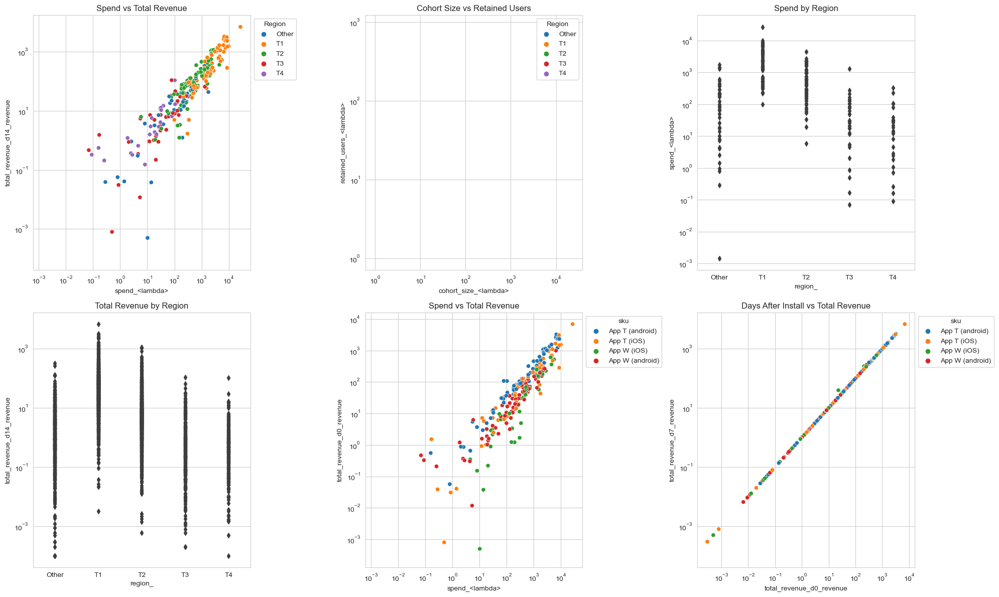

In [166]:



# Multivariate plots
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# 1. Scatter plot for spend vs total revenue
sns.scatterplot(data=cohorted_df, x='spend_<lambda>', y='total_revenue_d14_revenue', hue='region_', ax=axes[0, 0])
axes[0, 0].set_title('Spend vs Total Revenue')
axes[0, 0].set_xscale('log')
axes[0, 0].set_yscale('log')
axes[0, 0].legend(title='Region', bbox_to_anchor=(1, 1))

# 2. Scatter plot for cohort size vs retained users
sns.scatterplot(data=cohorted_df, x='cohort_size_<lambda>', y='retained_users_<lambda>', hue='region_', ax=axes[0, 1])
axes[0, 1].set_title('Cohort Size vs Retained Users')
axes[0, 1].set_xscale('log')
axes[0, 1].set_yscale('log')
axes[0, 1].legend(title='Region', bbox_to_anchor=(1, 1))

# 3. Box plot for spend by region
sns.boxplot(data=cohorted_df, x='region_', y='spend_<lambda>', ax=axes[0, 2])
axes[0, 2].set_title('Spend by Region')
axes[0, 2].set_yscale('log')

# 4. Box plot for total revenue by region
sns.boxplot(data=cohorted_df, x='region_', y='total_revenue_d14_revenue', ax=axes[1, 0])
axes[1, 0].set_title('Total Revenue by Region')
axes[1, 0].set_yscale('log')

# 5. Scatter plot for spend vs total revenue
sns.scatterplot(data=cohorted_df, x='spend_<lambda>', y='total_revenue_d0_revenue', hue='sku_', ax=axes[1, 1])
axes[1, 1].set_title('Spend vs Total Revenue')
axes[1, 1].set_xscale('log')
axes[1, 1].set_yscale('log')
axes[1, 1].legend(title='sku', bbox_to_anchor=(1, 1))

# 6. Scatter plot for spend vs total revenue
sns.scatterplot(data=cohorted_df, x='total_revenue_d0_revenue', y='total_revenue_d7_revenue', hue='sku_', ax=axes[1, 2])
axes[1, 2].set_title('Days After Install vs Total Revenue')
axes[1, 2].set_xscale('log')
axes[1, 2].set_yscale('log')
axes[1, 2].legend(title='sku', bbox_to_anchor=(1, 1))


plt.tight_layout()
plt.show()
    

**EUREKA MOMENT!**: 
*when looking at the D0-D7 revenue correlation, I thought that maybe current revenue growth could predict revenue 30 days into the future*

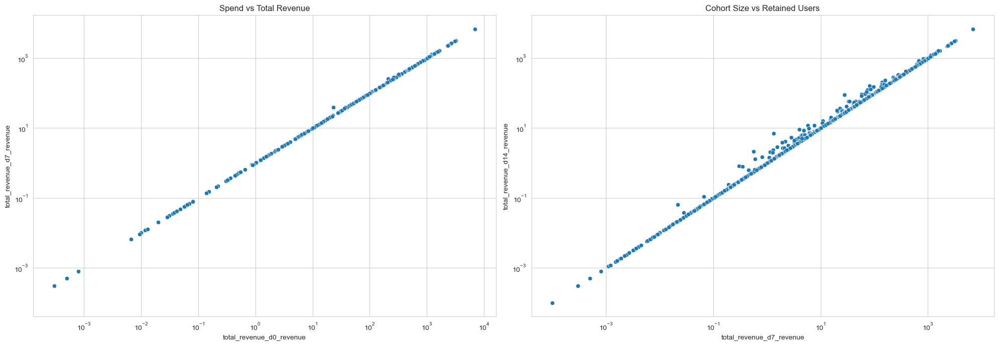

In [167]:
# Multivariate plots
fig, axes = plt.subplots(1, 2, figsize=(20, 7))

# 1. Scatter plot for spend vs total revenue
sns.scatterplot(data=cohorted_df, x='total_revenue_d0_revenue', y='total_revenue_d7_revenue', ax=axes[0])
axes[0].set_title('Spend vs Total Revenue')
axes[0].set_xscale('log')
axes[0].set_yscale('log')

# 2. Scatter plot for cohort size vs retained users
sns.scatterplot(data=cohorted_df, x='total_revenue_d7_revenue', y='total_revenue_d14_revenue', ax=axes[1])
axes[1].set_title('Cohort Size vs Retained Users')
axes[1].set_xscale('log')
axes[1].set_yscale('log')


plt.tight_layout()
plt.show()
    

## Redefining the data set

A few adjustments were made to the original dataset based on the latest discoveries. 

Now the dataset has the following columns:

- date                
- sku                 
- network_name        
- region              
- spend               
- d0_paid_revenue     
- d0_organic_revenue  
- d7_paid_revenue     
- d7_organic_revenue  
- d14_paid_revenue    
- d14_organic_revenue 
- d30_paid_revenue    
- d30_organic_revenue 
- d60_paid_revenue    
- d60_organic_revenue 
- d90_paid_revenue    
- d90_organic_revenue 
- d120_paid_revenue   
- d120_organic_revenue
- d150_paid_revenue   
- d150_organic_revenue
- d180_paid_revenue   
- d180_organic_revenue
- d210_paid_revenue   
- d210_organic_revenue
- d240_paid_revenue   
- d240_organic_revenue
- d270_paid_revenue   
- d270_organic_revenue
- d300_paid_revenue   
- d300_organic_revenue
- d330_paid_revenue   
- d330_organic_revenue
- d360_paid_revenue   
- d360_organic_revenue

Specific modeling for the app "App T (android)" will be implemented since the apps behave differently from each other. All the channels and regions for this specific app will be used for modeling.

In [168]:
data = pd.read_csv('sample_data_2_ofuscated.csv')
data.head()

,date,sku,network_name,region,spend,d0_paid_revenue,d0_organic_revenue,d7_paid_revenue,d7_organic_revenue,d14_paid_revenue,...,d240_paid_revenue,d240_organic_revenue,d270_paid_revenue,d270_organic_revenue,d300_paid_revenue,d300_organic_revenue,d330_paid_revenue,d330_organic_revenue,d360_paid_revenue,d360_organic_revenue
0,2021-01-09 00:00:00,App T (android),Channel F,T1,8643.714396,3690.80835,651.381650,5932.84372,1209.219720,6555.86748,...,9737.95897,1874.807299,9856.36507,1912.001697,9920.16257,1928.197908,9975.10027,1942.910550,10069.34577,1966.276748
1,2022-04-06 00:00:00,App T (android),Channel F,Other,458.032503,167.69770,16.234457,275.22140,36.814774,316.85140,...,410.66620,50.585472,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2022-02-23 00:00:00,App T (android),Channel F,T3,529.534628,186.28890,5.182008,268.48480,7.485552,295.22240,...,346.26800,12.467445,348.81960,12.562045,351.02740,12.562045,NaN,NaN,NaN,NaN
3,2020-05-10 00:00:00,App T (android),Channel F,T2,288.020000,120.78060,12.869016,195.67806,23.203026,220.78707,...,368.53602,68.571153,373.23396,70.326710,414.20781,72.139378,418.22165,74.169235,419.78115,75.330767
4,2022-04-27 00:00:00,App T (android),Channel F,T3,121.620458,76.96390,1.642729,137.76170,3.693580,144.49770,...,159.08490,10.966451,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [169]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27328 entries, 0 to 27327
Data columns (total 35 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   date                  27328 non-null  object 
 1   sku                   27328 non-null  object 
 2   network_name          27328 non-null  object 
 3   region                27328 non-null  object 
 4   spend                 26979 non-null  float64
 5   d0_paid_revenue       26979 non-null  float64
 6   d0_organic_revenue    26979 non-null  float64
 7   d7_paid_revenue       26764 non-null  float64
 8   d7_organic_revenue    26764 non-null  float64
 9   d14_paid_revenue      26586 non-null  float64
 10  d14_organic_revenue   26586 non-null  float64
 11  d30_paid_revenue      26176 non-null  float64
 12  d30_organic_revenue   26176 non-null  float64
 13  d60_paid_revenue      25498 non-null  float64
 14  d60_organic_revenue   25498 non-null  float64
 15  d90_paid_revenue   

In [170]:
data.isna().sum()

date                        0
sku                         0
network_name                0
region                      0
spend                     349
d0_paid_revenue           349
d0_organic_revenue        349
d7_paid_revenue           564
d7_organic_revenue        564
d14_paid_revenue          742
d14_organic_revenue       742
d30_paid_revenue         1152
d30_organic_revenue      1152
d60_paid_revenue         1830
d60_organic_revenue      1830
d90_paid_revenue         2730
d90_organic_revenue      2730
d120_paid_revenue        3630
d120_organic_revenue     3630
d150_paid_revenue        4530
d150_organic_revenue     4530
d180_paid_revenue        5430
d180_organic_revenue     5430
d210_paid_revenue        6330
d210_organic_revenue     6330
d240_paid_revenue        7230
d240_organic_revenue     7230
d270_paid_revenue        8130
d270_organic_revenue     8130
d300_paid_revenue        9030
d300_organic_revenue     9030
d330_paid_revenue        9930
d330_organic_revenue     9930
d360_paid_

In [171]:
paid_revenue_columns = [col for col in data.columns if 'paid_revenue' in col]
paid_revenue_data = data[paid_revenue_columns].copy()

In [172]:
cohorts = []
percents = []

for c in range(2,13):
  cohort = c*30
  prev_cohort = (c-1)*30
  percent = len(data.query(f'd{cohort}_paid_revenue > 0 & d{cohort}_paid_revenue == d{prev_cohort}_paid_revenue'))/len(data.query(f'd{cohort}_paid_revenue > 0'))
  cohorts.append(cohort)
  percents.append(percent*100)
  # print(f'd{cohort} percent: {percent}')
  
  
no_growth_percent_df = pd.DataFrame({'cohort': cohorts, 'no_growth_percent': percents})
no_growth_percent_df = no_growth_percent_df.set_index('cohort')
no_growth_percent_df

,no_growth_percent
cohort,
60,21.744792
90,25.614444
120,27.435183
150,29.496358
180,30.887428
210,31.764386
240,32.860098
270,33.925079
300,34.487689


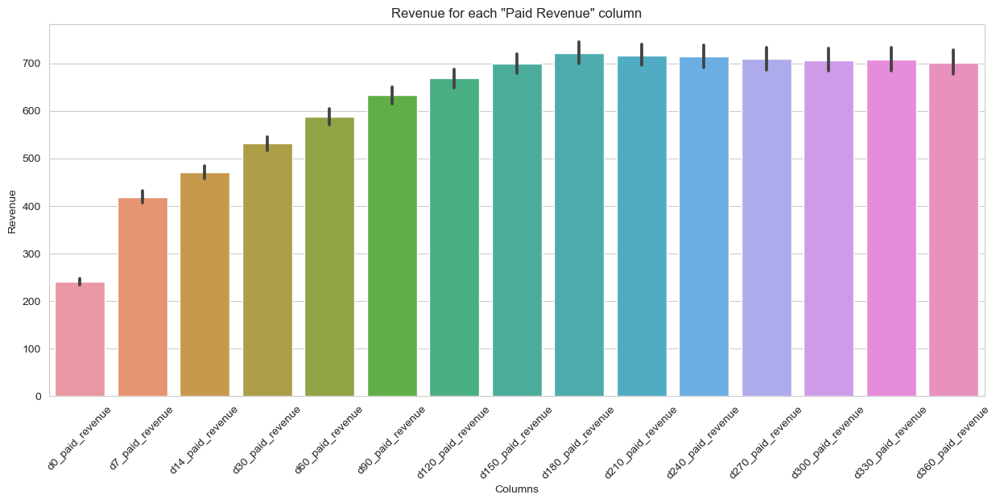

In [173]:
# Reshape the DataFrame
paid_revenue_data_melted = paid_revenue_data.melt(var_name='Column', value_name='Revenue')

# Create the bar plot
plt.figure(figsize=(15, 6))
sns.barplot(x='Column', y='Revenue', data=paid_revenue_data_melted)
plt.title('Revenue for each "Paid Revenue" column')
plt.ylabel('Revenue')
plt.xlabel('Columns')
plt.xticks(rotation=45)
plt.show()


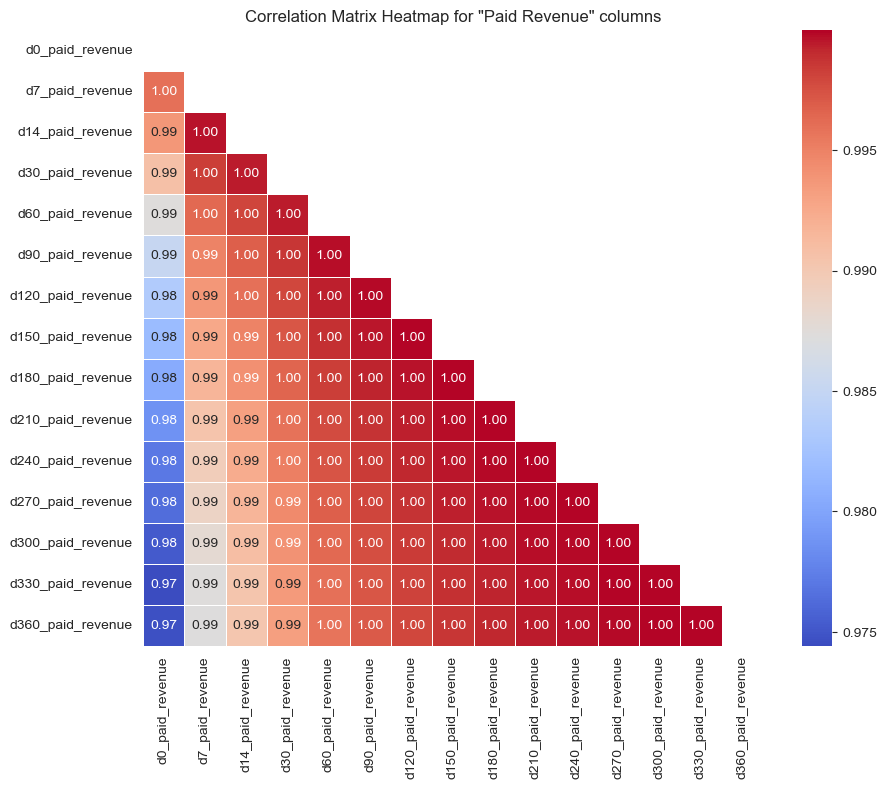

In [174]:
correlation_matrix = paid_revenue_data.corr()

# Remove duplicate correlations by setting upper-triangular matrix values to NaN
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix Heatmap for "Paid Revenue" columns')
plt.show()


- The columns related to earlier days (e.g., d0_paid_revenue, d7_paid_revenue, etc.) are highly correlated with each other.
- As we move towards later days, the correlation slightly decreases but remains very high.

In [175]:
min(data['date']), max(data['date'])

('2020-04-01 00:00:00', '2023-01-01 00:00:00')

In [176]:
d14_cols = ['spend','d0_paid_revenue', 'd0_organic_revenue','d7_paid_revenue', 'd7_organic_revenue','d14_paid_revenue', 'd14_organic_revenue']
data[d14_cols]

,spend,d0_paid_revenue,d0_organic_revenue,d7_paid_revenue,d7_organic_revenue,d14_paid_revenue,d14_organic_revenue
0,8643.714396,3690.80835,651.381650,5932.84372,1209.219720,6555.86748,1373.111694
1,458.032503,167.69770,16.234457,275.22140,36.814774,316.85140,40.384622
2,529.534628,186.28890,5.182008,268.48480,7.485552,295.22240,8.269822
3,288.020000,120.78060,12.869016,195.67806,23.203026,220.78707,28.221605
4,121.620458,76.96390,1.642729,137.76170,3.693580,144.49770,3.942621
...,...,...,...,...,...,...,...
27323,0.000000,0.00000,0.000190,0.00000,0.000190,0.00000,0.000190
27324,0.000000,0.00000,0.049252,0.00000,0.049252,0.00000,0.049252
27325,0.000000,0.00000,0.000018,0.00000,0.000018,0.00000,0.000018
27326,0.000000,0.00000,0.064551,0.00000,0.064551,0.00000,0.064551


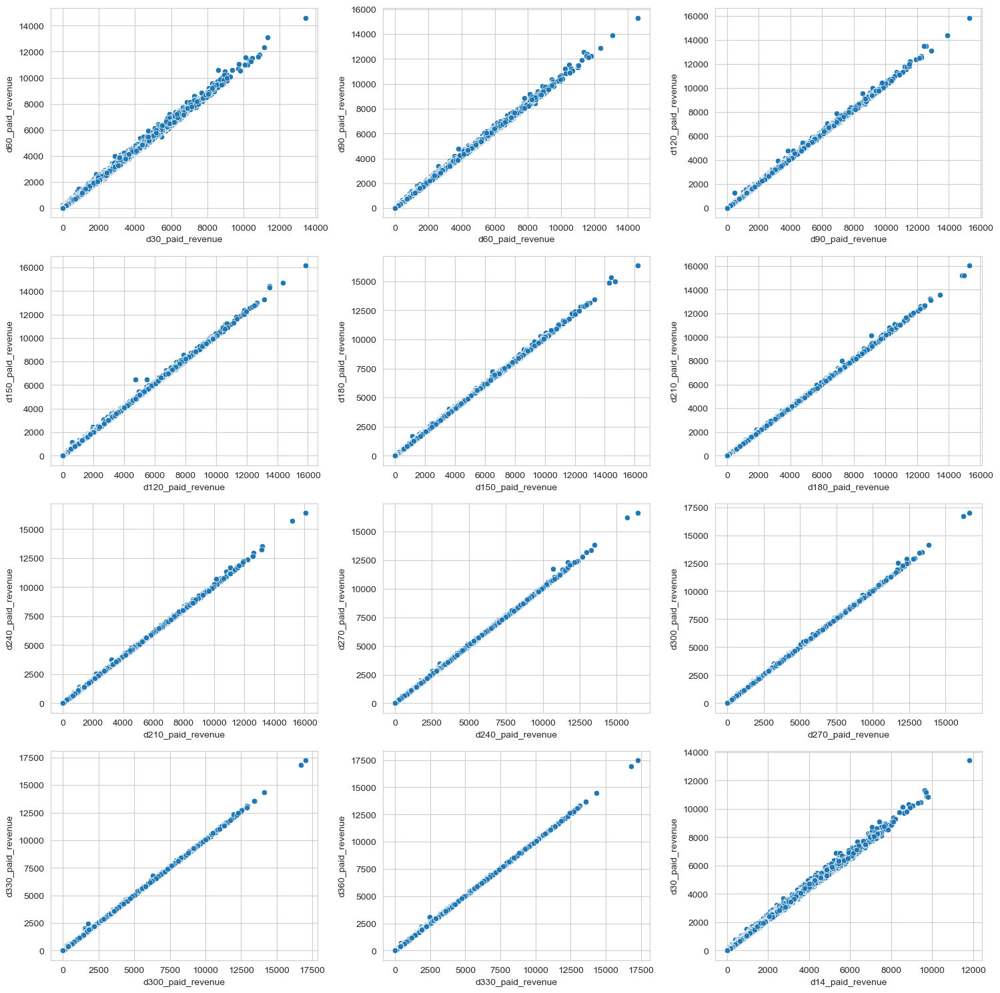

In [177]:
fig, axs = plt.subplots(4, 3, figsize=(15, 15)) # Define a grid of 4x3 subplots
axs = axs.ravel() # Flatten the grid into a 1D array to easily iterate over

for i, c in enumerate(range(2, 14)): # Modify the range to fit 12 plots

  if i == 11:
    sns.scatterplot(data=data, x=f'd14_paid_revenue', y=f'd30_paid_revenue', ax=axs[i]) 
  else:
    cohort = c * 30
    prev_cohort = (c - 1) * 30
    sns.scatterplot(data=data, y=f'd{cohort}_paid_revenue', x=f'd{prev_cohort}_paid_revenue', ax=axs[i]) 

plt.tight_layout() # Improve appearance
plt.show() # Show the plot

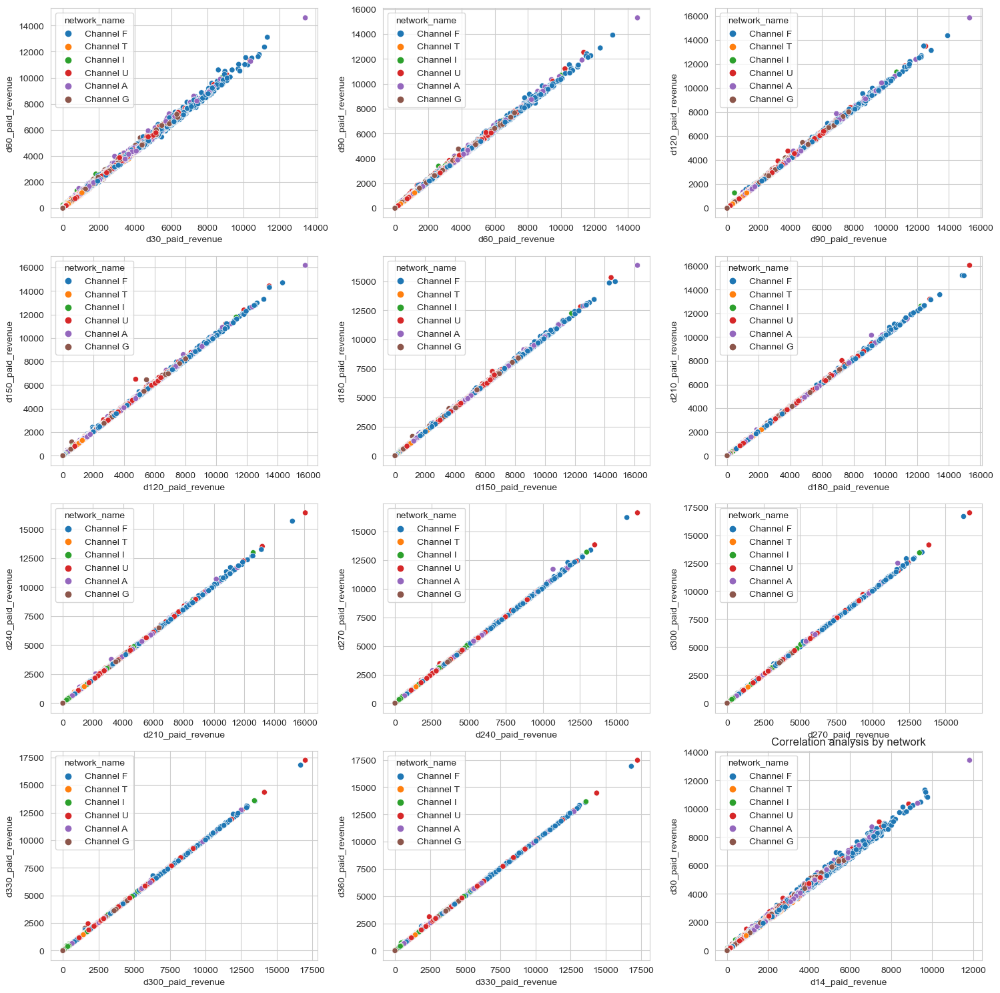

In [178]:
fig, axs = plt.subplots(4, 3, figsize=(15, 15)) # Define a grid of 4x3 subplots
axs = axs.ravel() # Flatten the grid into a 1D array to easily iterate over

for i, c in enumerate(range(2, 14)): # Modify the range to fit 12 plots

  if i == 11:
    sns.scatterplot(data=data, x=f'd14_paid_revenue', y=f'd30_paid_revenue', hue='network_name', ax=axs[i]) 
  else:
    cohort = c * 30
    prev_cohort = (c - 1) * 30
    sns.scatterplot(data=data, y=f'd{cohort}_paid_revenue', x=f'd{prev_cohort}_paid_revenue', hue='network_name', ax=axs[i]) 

plt.tight_layout() # Improve appearance
plt.title('Correlation analysis by network')
plt.show() # Show the plot

Most of the data seems to be from `Channel F` but there's a fair amount of data from other channels

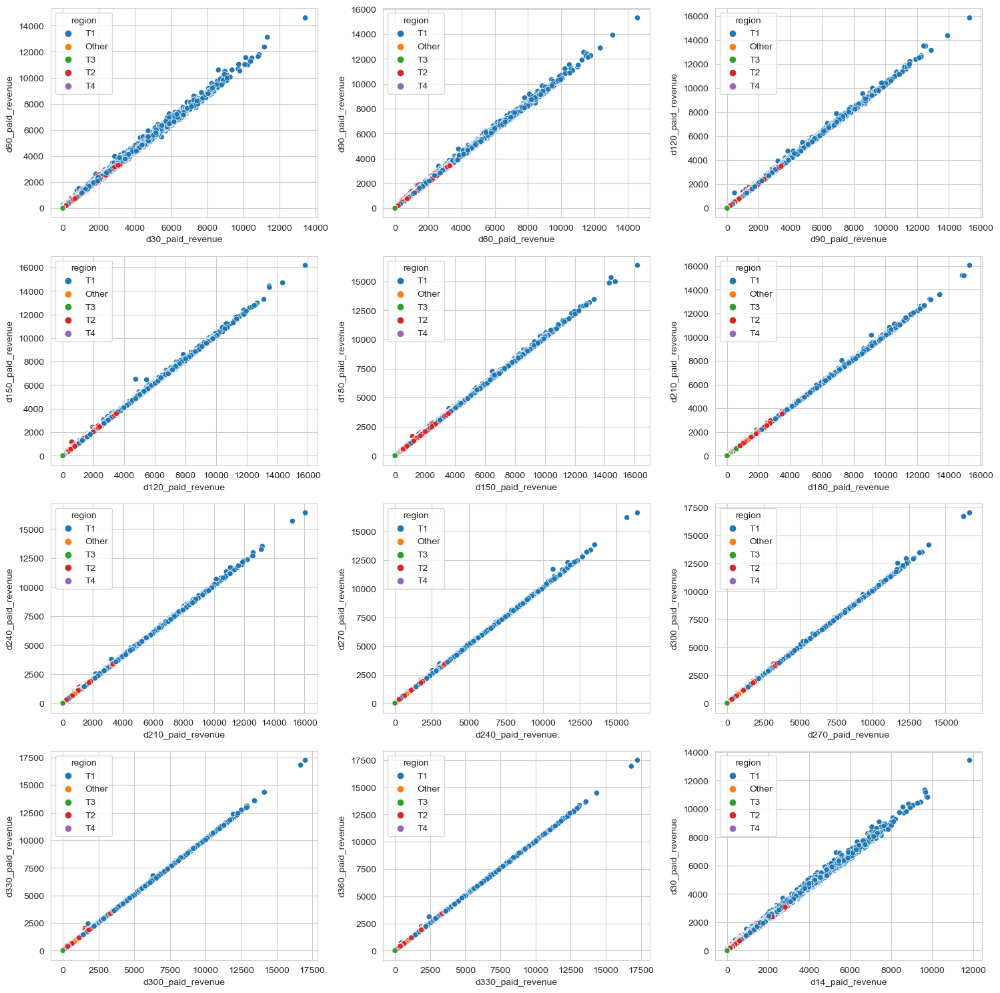

In [179]:
fig, axs = plt.subplots(4, 3, figsize=(15, 15)) # Define a grid of 4x3 subplots
axs = axs.ravel() # Flatten the grid into a 1D array to easily iterate over

for i, c in enumerate(range(2, 14)): # Modify the range to fit 12 plots

  if i == 11:
    sns.scatterplot(data=data, x=f'd14_paid_revenue', y=f'd30_paid_revenue', hue='region', ax=axs[i]) 
  else:
    cohort = c * 30
    prev_cohort = (c - 1) * 30
    sns.scatterplot(data=data, y=f'd{cohort}_paid_revenue', x=f'd{prev_cohort}_paid_revenue', hue='region', ax=axs[i]) 

plt.tight_layout() # Improve appearance
plt.show() # Show the plot

Most of the data belongs to the `T1` region - which makes sense because that's where the majority of the business is concentrated

The correlation is so strong, that adjacent cohorts might be enough to predict. Using the relationship between cohorts described in the plots. 

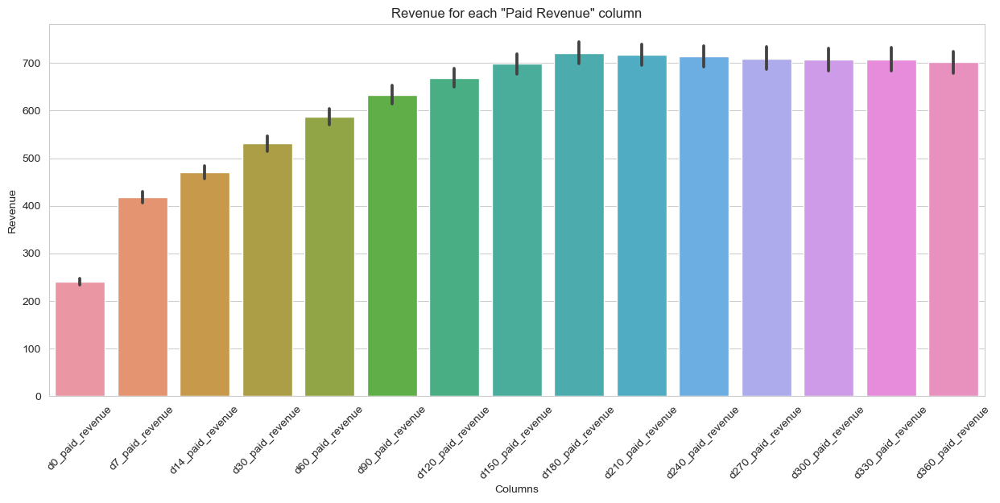

In [180]:
paid_rev_date = data[paid_revenue_columns]

# Reshape the DataFrame
paid_rev_date_melted = paid_rev_date.melt(var_name='Column', value_name='Revenue')

# Create the bar plot
plt.figure(figsize=(15, 6))
sns.barplot(x='Column', y='Revenue', data=paid_rev_date_melted)
plt.title('Revenue for each "Paid Revenue" column')
plt.ylabel('Revenue')
plt.xlabel('Columns')
plt.xticks(rotation=45)
plt.show()


### ORGANIC REVENUE ANALYSIS

In [181]:
organic_revenue_columns = [col for col in data.columns if 'organic_revenue' in col]
organic_revenue_data = data[organic_revenue_columns]
organic_revenue_data.describe()

,d0_organic_revenue,d7_organic_revenue,d14_organic_revenue,d30_organic_revenue,d60_organic_revenue,d90_organic_revenue,d120_organic_revenue,d150_organic_revenue,d180_organic_revenue,d210_organic_revenue,d240_organic_revenue,d270_organic_revenue,d300_organic_revenue,d330_organic_revenue,d360_organic_revenue
count,26979.000000,26764.000000,26586.000000,26176.000000,25498.000000,24598.000000,23698.000000,22798.000000,21898.000000,20998.000000,20098.000000,19198.000000,18298.000000,17398.000000,16498.000000
mean,33.223118,57.044830,65.345997,76.105108,87.249981,95.865711,102.948419,108.697532,113.162024,115.593281,118.290760,120.522517,122.234109,123.866560,125.479456
std,78.490424,136.375204,156.920483,183.513193,210.603394,230.422924,246.614916,259.906975,271.156096,279.283212,287.208571,294.107468,299.434226,303.532653,308.446789
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.153786,0.256188,0.286978,0.314567,0.321051,0.336928,0.341774,0.350115,0.347894,0.343774,0.340842,0.327674,0.310478,0.296898,0.286706
50%,0.865877,1.551605,1.778936,2.042185,2.187779,2.384596,2.451247,2.559250,2.580760,2.597850,2.608042,2.539623,2.405808,2.352277,2.283192
75%,19.090421,32.480290,37.158388,42.202987,47.959288,53.319461,58.283897,62.108954,65.509256,66.698591,68.103760,69.786454,71.046591,73.331730,74.619965
max,758.700923,1385.927492,1619.350873,1904.581947,2188.839780,2357.083981,2600.274887,2762.030714,3011.151424,3213.205411,3334.449754,3446.226955,3507.134261,3544.703608,3582.418025


In [182]:
cohorts = []
percents = []

for c in range(2,13):
  cohort = c*30
  prev_cohort = (c-1)*30
  percent = len(data.query(f'd{cohort}_organic_revenue > 0 & d{cohort}_organic_revenue == d{prev_cohort}_organic_revenue'))/len(data.query(f'd{cohort}_organic_revenue > 0'))
  cohorts.append(cohort)
  percents.append(percent*100)
  # print(f'd{cohort} percent: {percent}')
  
  
no_growth_percent_df = pd.DataFrame({'cohort': cohorts, 'no_growth_percent': percents})
no_growth_percent_df = no_growth_percent_df.set_index('cohort')
no_growth_percent_df

,no_growth_percent
cohort,
60,17.516319
90,23.758880
120,26.232903
150,28.670167
180,29.295669
210,29.927257
240,31.266915
270,31.021195
300,32.250267


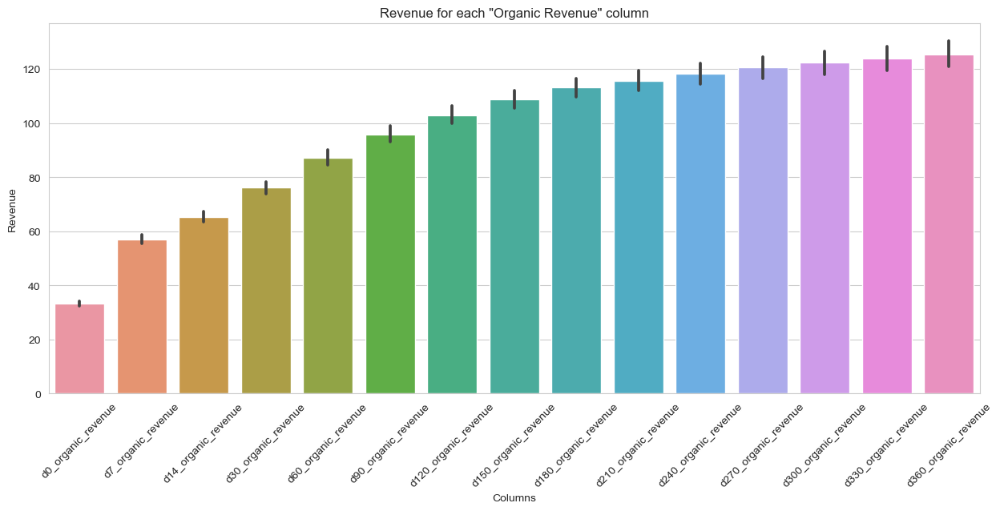

In [183]:
# Reshape the DataFrame
organic_revenue_data_melted = organic_revenue_data.melt(var_name='Column', value_name='Revenue')

# Create the bar plot
plt.figure(figsize=(15, 6))
sns.barplot(x='Column', y='Revenue', data=organic_revenue_data_melted)
plt.title('Revenue for each "Organic Revenue" column')
plt.ylabel('Revenue')
plt.xlabel('Columns')
plt.xticks(rotation=45)
plt.show()


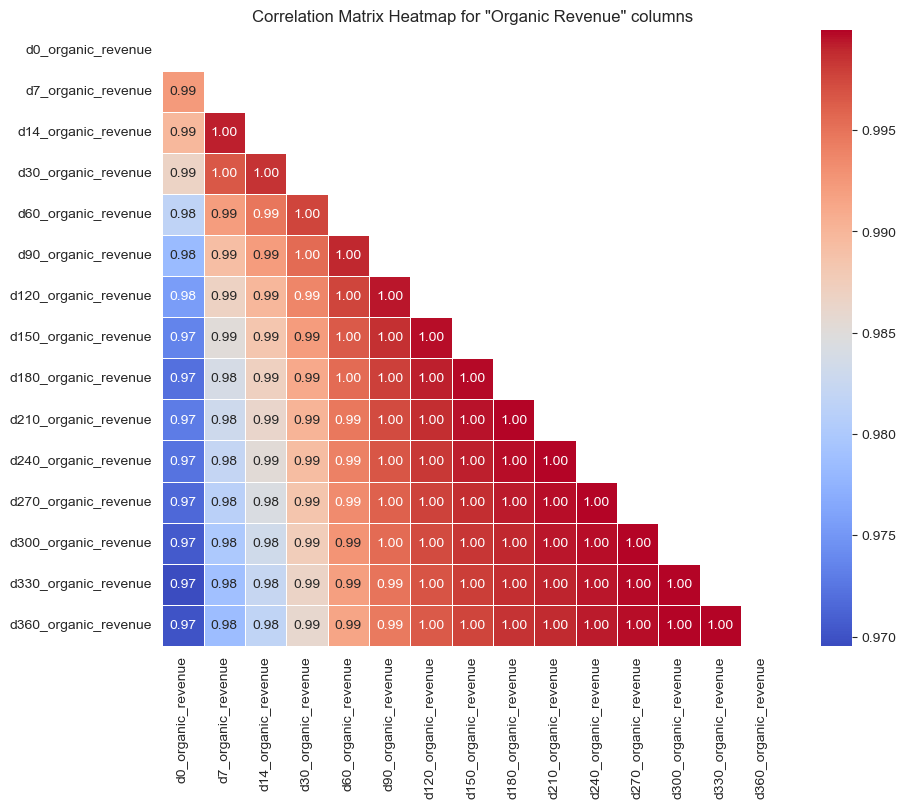

In [184]:
correlation_matrix = organic_revenue_data.corr()

# Remove duplicate correlations by setting upper-triangular matrix values to NaN
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix Heatmap for "Organic Revenue" columns')
plt.show()


It seems that the "organic revenue" columns also have strong correlations with each other, though there are some variations when compared to the "paid revenue" correlations.

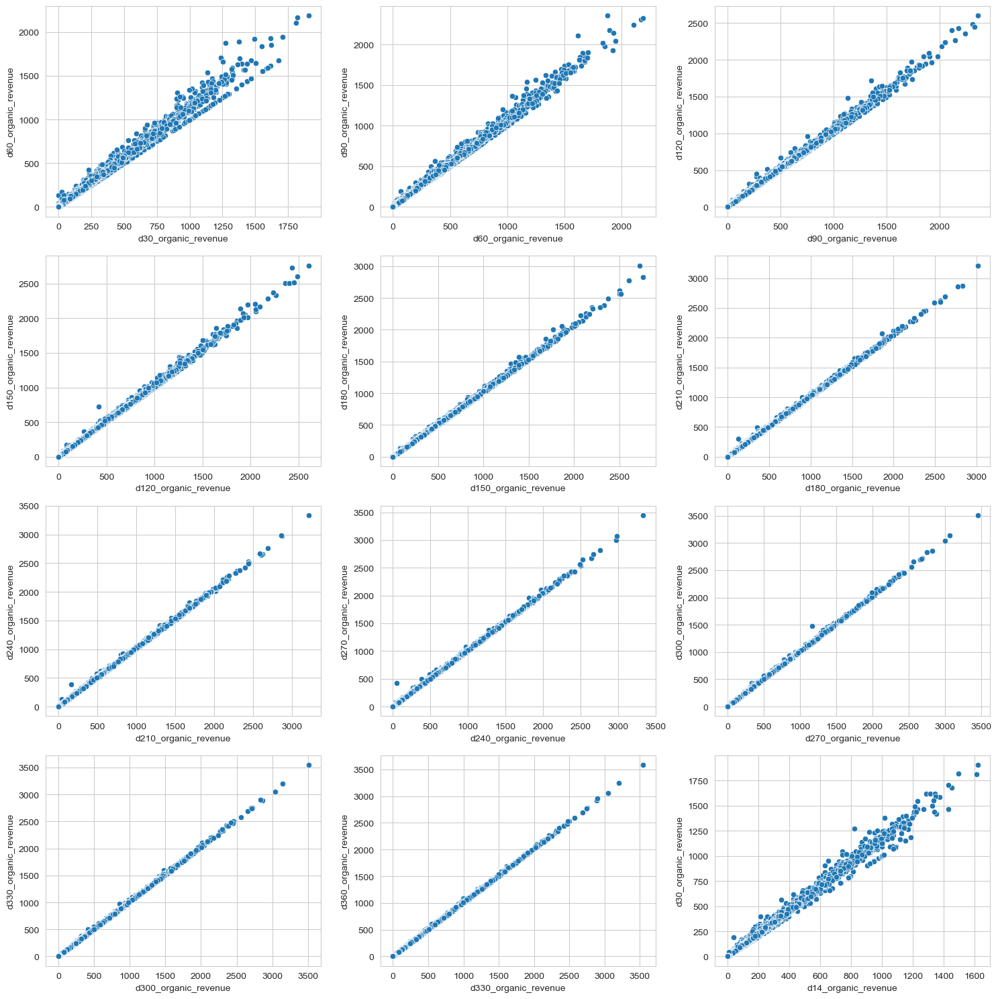

In [185]:
fig, axs = plt.subplots(4, 3, figsize=(15, 15)) # Define a grid of 4x3 subplots
axs = axs.ravel() # Flatten the grid into a 1D array to easily iterate over

for i, c in enumerate(range(2, 14)): # Modify the range to fit 12 plots

  if i == 11:
    sns.scatterplot(data=data, x=f'd14_organic_revenue', y=f'd30_organic_revenue', ax=axs[i]) 
  else:
    cohort = c * 30
    prev_cohort = (c - 1) * 30
    sns.scatterplot(data=data, y=f'd{cohort}_organic_revenue', x=f'd{prev_cohort}_organic_revenue', ax=axs[i]) 

plt.tight_layout() # Improve appearance
plt.show() # Show the plot

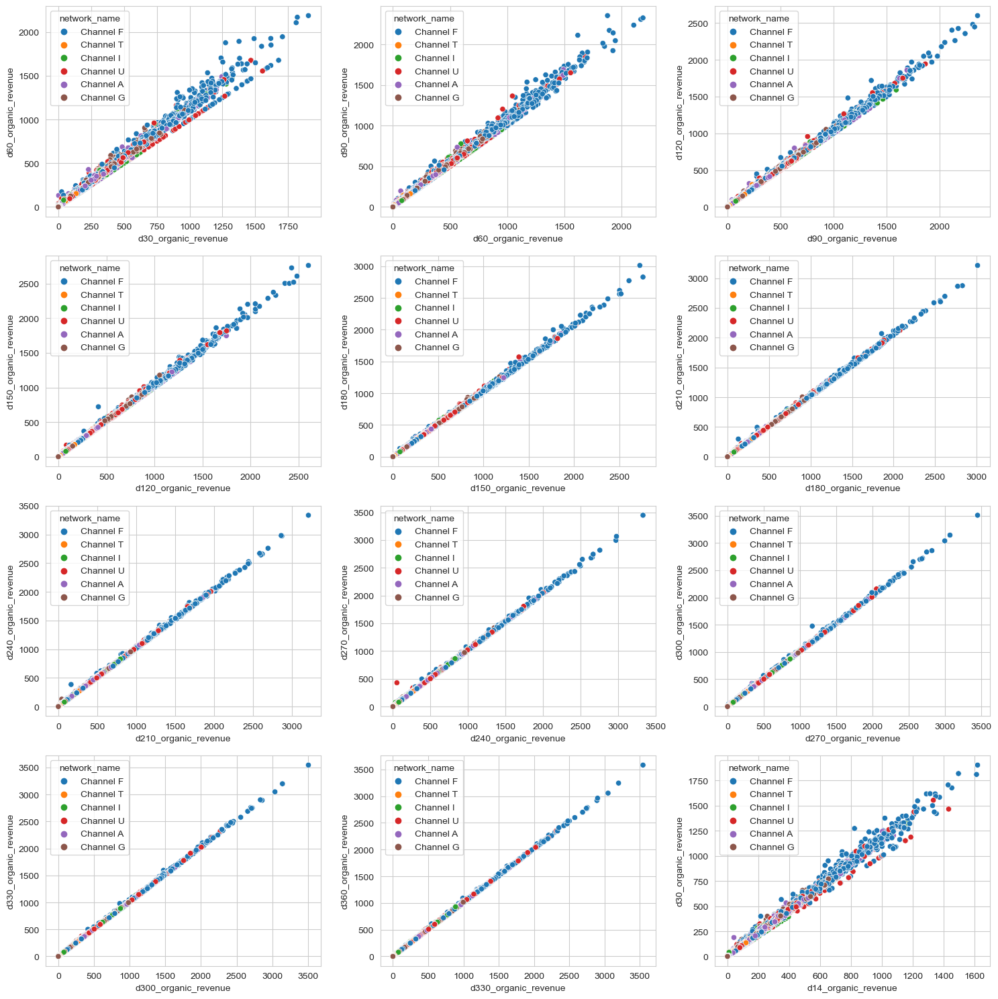

In [186]:
fig, axs = plt.subplots(4, 3, figsize=(15, 15)) # Define a grid of 4x3 subplots
axs = axs.ravel() # Flatten the grid into a 1D array to easily iterate over

for i, c in enumerate(range(2, 14)): # Modify the range to fit 12 plots

  if i == 11:
    sns.scatterplot(data=data, x=f'd14_organic_revenue', y=f'd30_organic_revenue', hue='network_name', ax=axs[i]) 
  else:
    cohort = c * 30
    prev_cohort = (c - 1) * 30
    sns.scatterplot(data=data, y=f'd{cohort}_organic_revenue', x=f'd{prev_cohort}_organic_revenue', hue='network_name', ax=axs[i]) 

plt.tight_layout() # Improve appearance
plt.show() # Show the plot

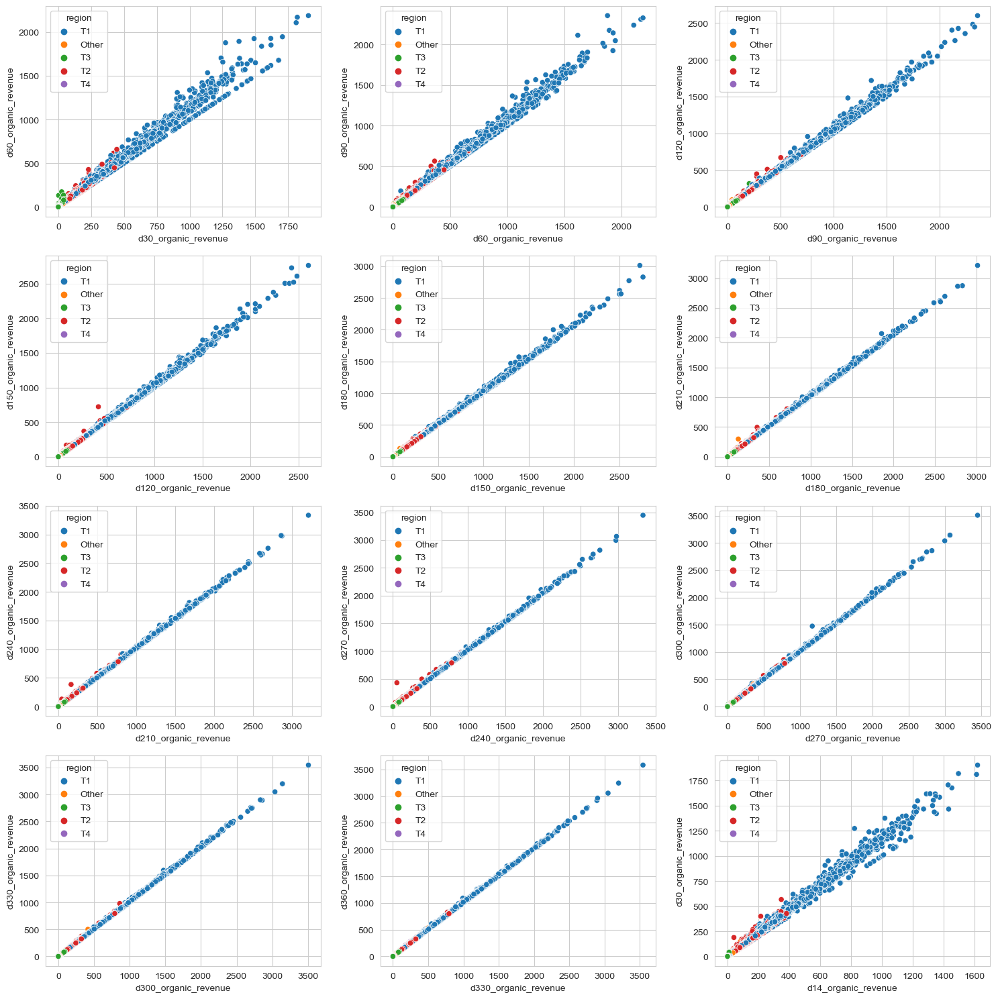

In [187]:
fig, axs = plt.subplots(4, 3, figsize=(15, 15)) # Define a grid of 4x3 subplots
axs = axs.ravel() # Flatten the grid into a 1D array to easily iterate over

for i, c in enumerate(range(2, 14)): # Modify the range to fit 12 plots

  if i == 11:
    sns.scatterplot(data=data, x=f'd14_organic_revenue', y=f'd30_organic_revenue', hue='region', ax=axs[i]) 
  else:
    cohort = c * 30
    prev_cohort = (c - 1) * 30
    sns.scatterplot(data=data, y=f'd{cohort}_organic_revenue', x=f'd{prev_cohort}_organic_revenue', hue='region', ax=axs[i]) 

plt.tight_layout() # Improve appearance
plt.show() # Show the plot

Very similar correlations between the different cohorts. I think the same approach applies to the organic revenue predictions.

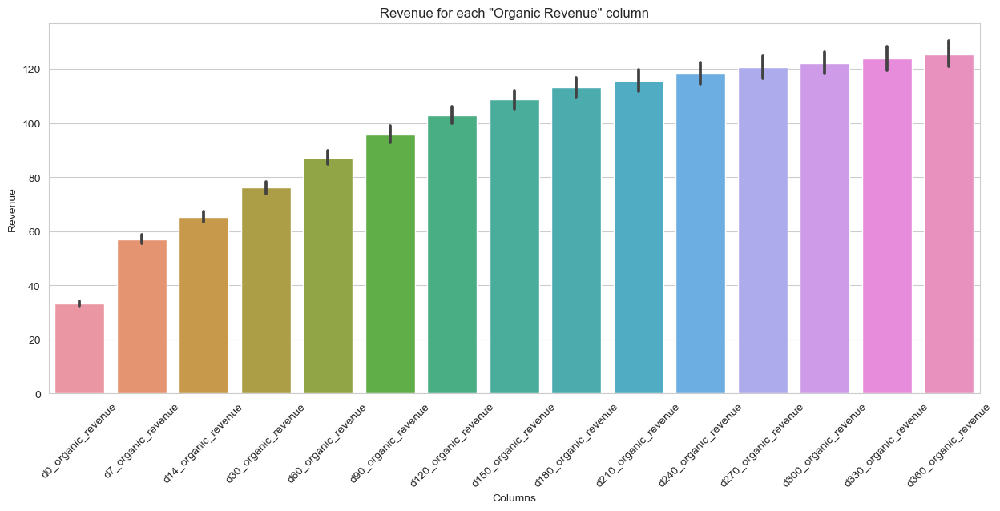

In [188]:
organic_rev_date = data[organic_revenue_columns]

# Reshape the DataFrame
organic_rev_date_melted = organic_rev_date.melt(var_name='Column', value_name='Revenue')

# Create the bar plot
plt.figure(figsize=(15, 6))
sns.barplot(x='Column', y='Revenue', data=organic_rev_date_melted)
plt.title('Revenue for each "Organic Revenue" column')
plt.ylabel('Revenue')
plt.xlabel('Columns')
plt.xticks(rotation=45)
plt.show()


### Modeling One More Time

In [189]:
cohorts = [7, 14, 30]

for c in range(2,13):
  cohort = c*30
  cohorts.append(cohort)
  
cohorts

[7, 14, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360]

Growth is an important metric used by subject-matter experts. It describes the increment in revenue from a given period to the next. In this case, we will use the growth of revenue from one cohort to the next. Those features will be added to the dataset.

In [190]:
growth_df = data.copy()

for i in range(len(cohorts)):
  
  if i > 0: 
    cohort = cohorts[i]
    prev_cohort = cohorts[i-1]
    growth_df[f'd{prev_cohort}_d{cohort}_paid_revenue'] = data[f'd{prev_cohort}_paid_revenue']/data[f'd{cohort}_paid_revenue']
    growth_df[f'd{prev_cohort}_d{cohort}_organic_revenue'] = data[f'd{prev_cohort}_organic_revenue']/data[f'd{cohort}_organic_revenue']


growth_df['date'] = pd.to_datetime(growth_df['date'])
growth_df['day_of_week'] = growth_df['date'].dt.dayofweek
growth_df['month'] = growth_df['date'].dt.month
growth_df['year'] = growth_df['date'].dt.year

growth_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27328 entries, 0 to 27327
Data columns (total 64 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   date                       27328 non-null  datetime64[ns]
 1   sku                        27328 non-null  object        
 2   network_name               27328 non-null  object        
 3   region                     27328 non-null  object        
 4   spend                      26979 non-null  float64       
 5   d0_paid_revenue            26979 non-null  float64       
 6   d0_organic_revenue         26979 non-null  float64       
 7   d7_paid_revenue            26764 non-null  float64       
 8   d7_organic_revenue         26764 non-null  float64       
 9   d14_paid_revenue           26586 non-null  float64       
 10  d14_organic_revenue        26586 non-null  float64       
 11  d30_paid_revenue           26176 non-null  float64       
 12  d30_

In [191]:
dimension_cols = ['network_name','region']
time_dimension_cols = ['day_of_week', 'month', 'year']
buckets = ['paid', 'organic']

In [192]:
train_df = growth_df.copy()

train_datasets = {}

for b in buckets:
  for i in range(len(cohorts)):
    if i > 0: 
      cohort = cohorts[i]
      prev_cohort = cohorts[i-1]
      
      growth_col = f'd{prev_cohort}_d{cohort}_{b}_revenue'
      feature_col = f'd{prev_cohort}_{b}_revenue'
      label_col = f'd{cohort}_{b}_revenue'

      train_dataset = train_df[dimension_cols + time_dimension_cols + [growth_col, feature_col, label_col]].copy()
      print(f'd{cohort}_{b}_revenue length: {len(train_dataset)}')
      
      train_dataset.dropna(inplace=True)
      print(f'd{cohort}_{b}_revenue length (dropna): {len(train_dataset)}')
      
      train_datasets[f'd{cohort}_{b}_revenue'] = train_dataset
      

d14_paid_revenue length: 27328
d14_paid_revenue length (dropna): 18286
d30_paid_revenue length: 27328
d30_paid_revenue length (dropna): 17998
d60_paid_revenue length: 27328
d60_paid_revenue length (dropna): 17485
d90_paid_revenue length: 27328
d90_paid_revenue length (dropna): 17170
d120_paid_revenue length: 27328
d120_paid_revenue length (dropna): 16508
d150_paid_revenue length: 27328
d150_paid_revenue length (dropna): 15924
d180_paid_revenue length: 27328
d180_paid_revenue length (dropna): 15359
d210_paid_revenue length: 27328
d210_paid_revenue length (dropna): 14702
d240_paid_revenue length: 27328
d240_paid_revenue length (dropna): 14017
d270_paid_revenue length: 27328
d270_paid_revenue length (dropna): 13294
d300_paid_revenue length: 27328
d300_paid_revenue length (dropna): 12590
d330_paid_revenue length: 27328
d330_paid_revenue length (dropna): 11902
d360_paid_revenue length: 27328
d360_paid_revenue length (dropna): 11205
d14_organic_revenue length: 27328
d14_organic_revenue lengt

I'm going to be using the following features to train the model:

Categorical features:
- network_name
- region

Time dimension features (taken from the date feature)
- day_of_week
- month
- year

revenue-related features (paid or organic):

- D14 organic/paid model will use the D7 organic/paid revenue feature
- D30 organic/paid model will use the D14 organic/paid revenue feature
- D60 organic/paid model will use the D30 organic/paid revenue feature
...
- D360 organic/paid model will use the D330 organic/paid revenue feature

In [193]:
models = []
scores = []
rmses = []
maes = []
rounds = []
regressors_1 = {}
coefs_1 = []

for b in buckets:
  for i in range(len(cohorts)):
    if i > 0: 
      cohort = cohorts[i]
      prev_cohort = cohorts[i-1]
      
      train_dataset = f'd{cohort}_{b}_revenue'
      
      label_col = f'd{cohort}_{b}_revenue'
      feature_col = f'd{prev_cohort}_{b}_revenue'

      X = train_datasets[f'd{cohort}_{b}_revenue'][dimension_cols + time_dimension_cols + [feature_col]]
      y = train_datasets[f'd{cohort}_{b}_revenue'][[label_col]]
      
      # One-Hot Encoding for dimension_cols
      X = pd.get_dummies(X, columns=dimension_cols)
      
      # print(f'fitting d{cohort}_{b} with {len(X)} records...')
      
      # Split the data into a training set and a test set
      X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

      # Define the parameter grid to search over
      param_grid = {
          'fit_intercept': [True, False]
      }
      
      # Create a GridSearchCV instance
      grid_search = GridSearchCV(LinearRegression(), param_grid, cv=5)
      
      # Train the model
      grid_search.fit(X_train, y_train)

      # Get the best model
      best_model = grid_search.best_estimator_

      # Make predictions on the test set
      y_pred = best_model.predict(X_test)

      # Calculate the root mean squared error and the mean absolute error
      rmse = mean_squared_error(y_test, y_pred)
      mae = mean_absolute_error(y_test, y_pred)
      score = best_model.score(X_test, y_test)

      coefficients_ = pd.DataFrame({
          'Feature': X_test.columns,
          'Coefficient': best_model.coef_[0]
      }).sort_values(by='Coefficient', ascending=False)


      print(f'd{cohort}_{b} coefficients:\n{coefficients_}')
      print(f'*' * 50)
      print(f'\n')

      models.append(f'd{cohort}_{b}_revenue')
      scores.append(score)
      rmses.append(rmse)
      maes.append(mae)
      rounds.append('first')
      
      regressors_1[f'd{cohort}_{b}'] = best_model

model_results_1 = pd.DataFrame({

  "models": models,
  "scores": scores,
  "rmses": rmses,
  "maes": maes,
  # "coefs": coefs_1,
  "rounds": rounds
})

model_results_1

d14_paid coefficients:
                   Feature  Coefficient
9   network_name_Channel U    10.188631
11               region_T1     6.784501
6   network_name_Channel G     6.415810
4   network_name_Channel A     4.283189
14               region_T4     2.128574
7   network_name_Channel I     1.747106
3          d7_paid_revenue     1.128332
13               region_T3     0.203062
0              day_of_week    -0.523853
1                    month    -0.524212
10            region_Other    -1.817210
2                     year    -6.807576
12               region_T2    -7.298927
8   network_name_Channel T   -10.321034
5   network_name_Channel F   -12.313701
**************************************************


d30_paid coefficients:
                   Feature  Coefficient
9   network_name_Channel U    14.434848
6   network_name_Channel G     9.360941
11               region_T1     8.153348
4   network_name_Channel A     3.734912
14               region_T4     3.078299
7   network_name_Chan

,models,scores,rmses,maes,rounds
0,d14_paid_revenue,0.999196,1424.047381,19.503344,first
1,d30_paid_revenue,0.998771,2480.965548,25.131225,first
2,d60_paid_revenue,0.998857,3119.202161,28.355172,first
3,d90_paid_revenue,0.999492,1425.242079,18.050227,first
4,d120_paid_revenue,0.999725,860.541188,14.756538,first
5,d150_paid_revenue,0.999779,780.797816,12.721992,first
6,d180_paid_revenue,0.999866,500.123654,11.052469,first
7,d210_paid_revenue,0.999894,401.755185,9.800165,first
8,d240_paid_revenue,0.999922,284.188860,8.462613,first
9,d270_paid_revenue,0.999932,268.020272,7.919444,first


*The models' scores are very good. The data patterns describe almost a perfect diagonal in most of the cases which explains the high scores. Having said that, is important to take into consideration that the output of one model is the input of the next one(input never "seen" by the models). This is a very important point to take into consideration when evaluating the models' performance.*

### Analyzing growth

*When talking to subject-matter experts, they felt uncomfortable with the idea of removing the data causing the skewness in most of the features. They mentioned that the definition of "outlier" should be thought in terms of the growth of revenue over time and not as a univariate analysis. In other words, the revenue performance on a given cohort should be compared to the revenue performance in previous dates. If the revenue growth of the cohort is much higher (or lower) than the previous cohorts, then it is considered an outlier. This is a more reasonable definition of "outlier" in this context.*

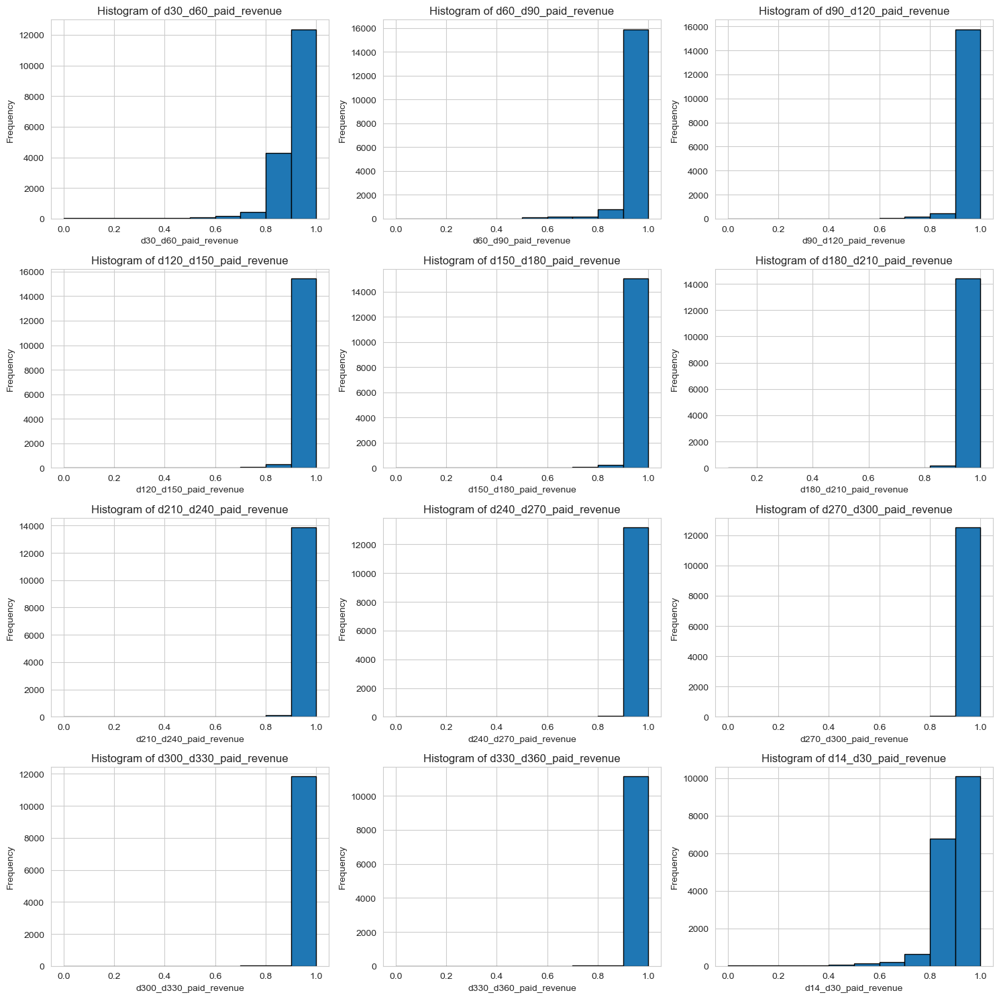

In [194]:
fig, axs = plt.subplots(4, 3, figsize=(15, 15)) # Define a grid of 4x3 subplots
axs = axs.ravel() # Flatten the grid into a 1D array to easily iterate over

for i, c in enumerate(range(2, 14)): # Modify the range to fit 12 plots
  if i == 11:
    axs[i].hist(train_datasets['d30_paid_revenue']['d14_d30_paid_revenue'], edgecolor='black')
    axs[i].set_xlabel('d14_d30_paid_revenue')
    axs[i].set_ylabel('Frequency')
    axs[i].set_title('Histogram of d14_d30_paid_revenue')
  else:
    cohort = c * 30
    prev_cohort = (c - 1) * 30
    
    axs[i].hist(train_datasets[f'd{cohort}_paid_revenue'][f'd{prev_cohort}_d{cohort}_paid_revenue'], edgecolor='black')
    axs[i].set_xlabel(f'd{prev_cohort}_d{cohort}_paid_revenue')
    axs[i].set_ylabel('Frequency')
    axs[i].set_title(f'Histogram of d{prev_cohort}_d{cohort}_paid_revenue')

plt.tight_layout() # Improve appearance
plt.show() # Show the plot


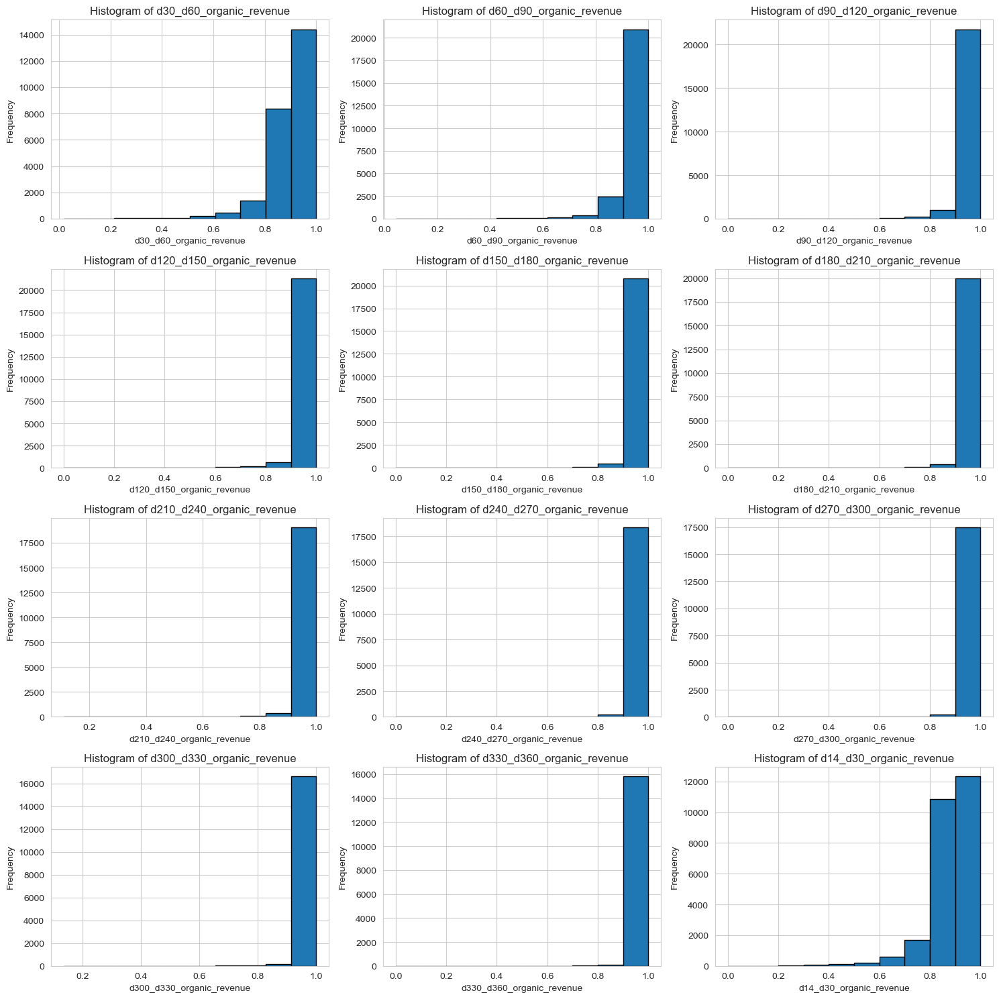

In [195]:
fig, axs = plt.subplots(4, 3, figsize=(15, 15)) # Define a grid of 4x3 subplots
axs = axs.ravel() # Flatten the grid into a 1D array to easily iterate over

for i, c in enumerate(range(2, 14)): # Modify the range to fit 12 plots
  if i == 11:
    axs[i].hist(train_datasets['d30_organic_revenue']['d14_d30_organic_revenue'], edgecolor='black')
    axs[i].set_xlabel('d14_d30_organic_revenue')
    axs[i].set_ylabel('Frequency')
    axs[i].set_title('Histogram of d14_d30_organic_revenue')
  else:
    cohort = c * 30
    prev_cohort = (c - 1) * 30
    
    axs[i].hist(train_datasets[f'd{cohort}_organic_revenue'][f'd{prev_cohort}_d{cohort}_organic_revenue'], edgecolor='black')
    axs[i].set_xlabel(f'd{prev_cohort}_d{cohort}_organic_revenue')
    axs[i].set_ylabel('Frequency')
    axs[i].set_title(f'Histogram of d{prev_cohort}_d{cohort}_organic_revenue')

plt.tight_layout() # Improve appearance
plt.show() # Show the plot


### Removing growth coeficient outliers

Since we have a lot of models to optimize, a couple of functions will be created to identify/remove outliers programmatically instead of going through each model manually. A Interquartile Range (IQR) is computed as the difference between Q3 and Q1. Data points below the `lower_bound` or above the `upper_bound` are considered potential outliers. Those boundaries are computed as follows:

```
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
```


In [196]:
def find_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    # Define the range for valid observations
    lower_bound = Q1 - 1.5*IQR
    upper_bound = Q3 + 1.5*IQR

    # Identify the outliers
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    
    return outliers
    
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    # Define the range for valid observations
    lower_bound = Q1 - 1.5*IQR
    upper_bound = Q3 + 1.5*IQR

    # Select only the rows with valid values
    no_outliers = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    
    return no_outliers

Applying the functions to the different datasets

In [197]:
for b in buckets:
  for i in range(len(cohorts)):
    if i > 0: 
      cohort = cohorts[i]
      prev_cohort = cohorts[i-1]
      
      growth_col = f'd{prev_cohort}_d{cohort}_{b}_revenue'
      
      train_dataset = train_datasets[f'd{cohort}_{b}_revenue']
      print(f'd{cohort}_{b}_revenue length: {len(train_dataset)}')
      
      train_dataset = remove_outliers(train_dataset, growth_col)
      print(f'd{cohort}_{b}_revenue length (w/o outliers): {len(train_dataset)}\n')
      
      train_datasets[f'd{cohort}_{b}_revenue'] = train_dataset



d14_paid_revenue length: 18286
d14_paid_revenue length (w/o outliers): 17580

d30_paid_revenue length: 17998
d30_paid_revenue length (w/o outliers): 17448

d60_paid_revenue length: 17485
d60_paid_revenue length (w/o outliers): 16952

d90_paid_revenue length: 17170
d90_paid_revenue length (w/o outliers): 16441

d120_paid_revenue length: 16508
d120_paid_revenue length (w/o outliers): 15727

d150_paid_revenue length: 15924
d150_paid_revenue length (w/o outliers): 15150

d180_paid_revenue length: 15359
d180_paid_revenue length (w/o outliers): 14601

d210_paid_revenue length: 14702
d210_paid_revenue length (w/o outliers): 13873

d240_paid_revenue length: 14017
d240_paid_revenue length (w/o outliers): 13184

d270_paid_revenue length: 13294
d270_paid_revenue length (w/o outliers): 12472

d300_paid_revenue length: 12590
d300_paid_revenue length (w/o outliers): 11755

d330_paid_revenue length: 11902
d330_paid_revenue length (w/o outliers): 11091

d360_paid_revenue length: 11205
d360_paid_revenu

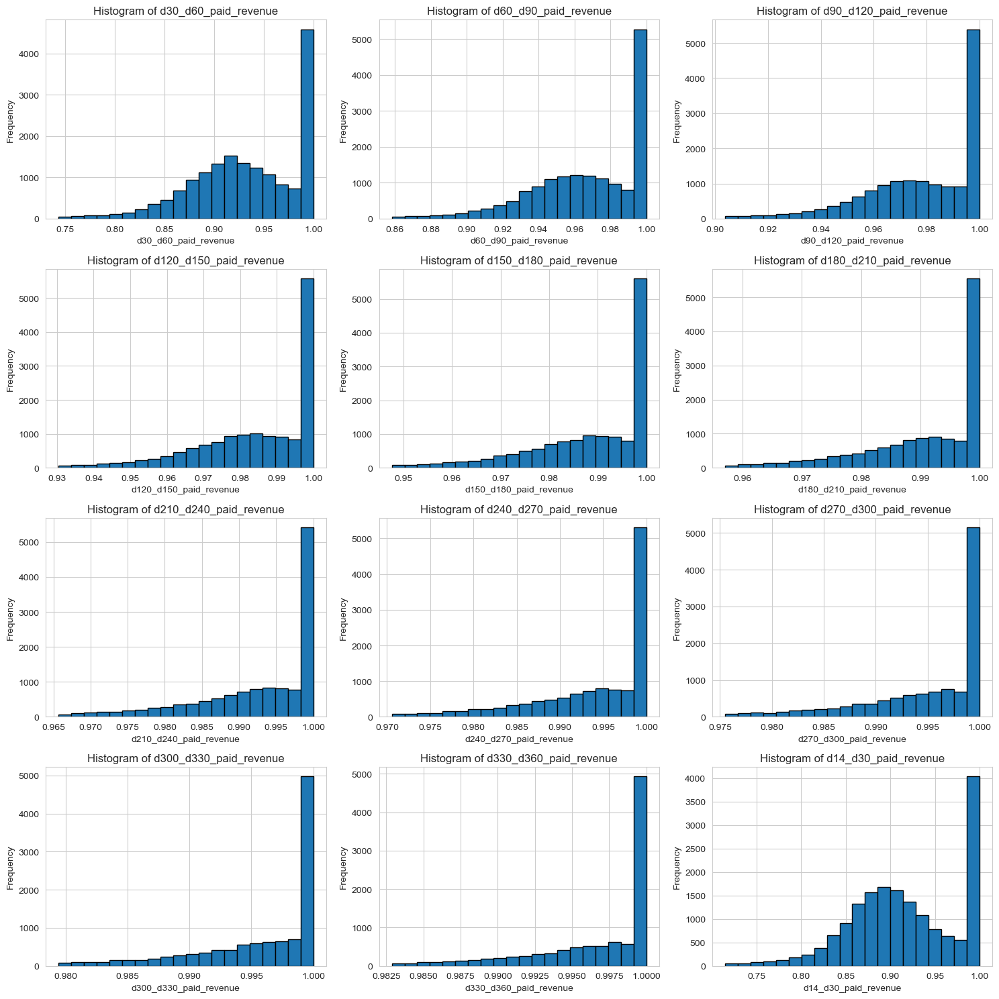

In [198]:
fig, axs = plt.subplots(4, 3, figsize=(15, 15)) # Define a grid of 4x3 subplots
axs = axs.ravel() # Flatten the grid into a 1D array to easily iterate over

for i, c in enumerate(range(2, 14)): # Modify the range to fit 12 plots
  if i == 11:
    axs[i].hist(train_datasets['d30_paid_revenue']['d14_d30_paid_revenue'], bins=20, edgecolor='black')
    axs[i].set_xlabel('d14_d30_paid_revenue')
    axs[i].set_ylabel('Frequency')
    axs[i].set_title('Histogram of d14_d30_paid_revenue')
  else:
    cohort = c * 30
    prev_cohort = (c - 1) * 30
    
    axs[i].hist(train_datasets[f'd{cohort}_paid_revenue'][f'd{prev_cohort}_d{cohort}_paid_revenue'], bins=20, edgecolor='black')
    axs[i].set_xlabel(f'd{prev_cohort}_d{cohort}_paid_revenue')
    axs[i].set_ylabel('Frequency')
    axs[i].set_title(f'Histogram of d{prev_cohort}_d{cohort}_paid_revenue')

plt.tight_layout() # Improve appearance
plt.show() # Show the plot


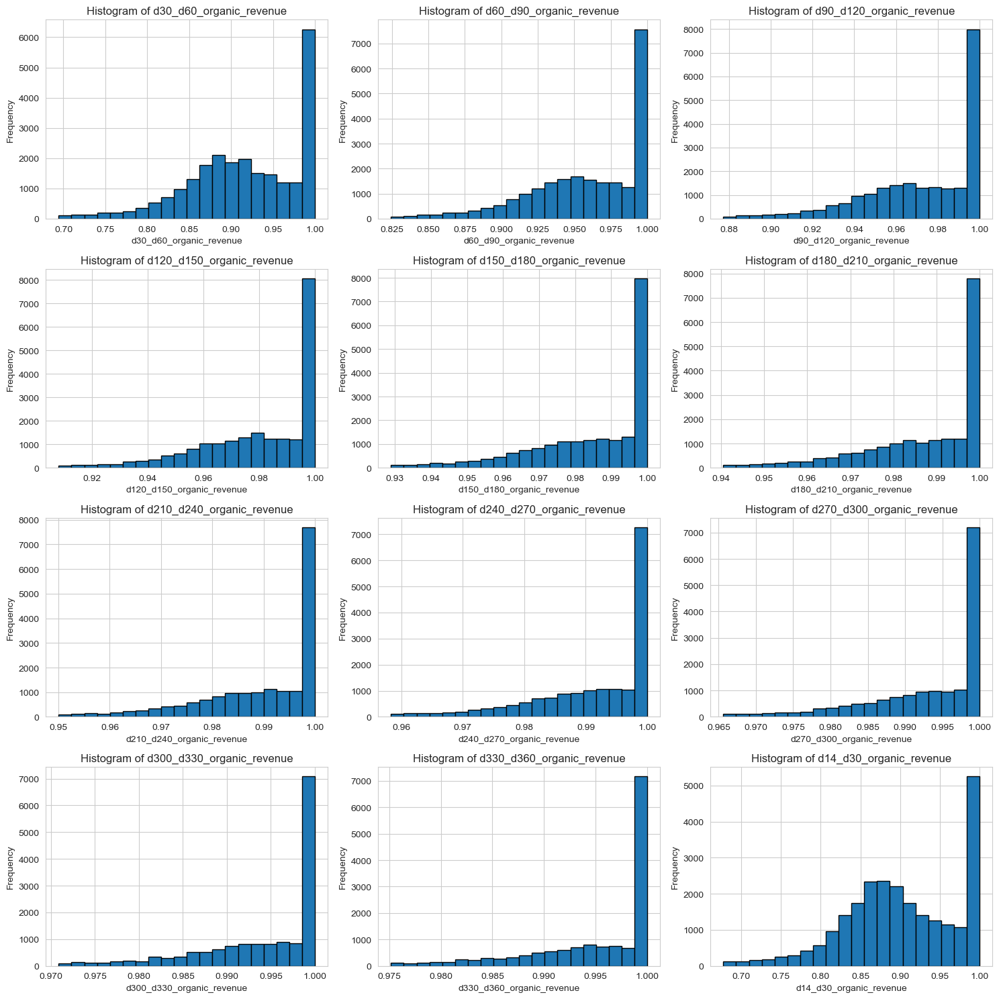

In [199]:
fig, axs = plt.subplots(4, 3, figsize=(15, 15)) # Define a grid of 4x3 subplots
axs = axs.ravel() # Flatten the grid into a 1D array to easily iterate over

for i, c in enumerate(range(2, 14)): # Modify the range to fit 12 plots
  if i == 11:
    axs[i].hist(train_datasets['d30_organic_revenue']['d14_d30_organic_revenue'], bins=20, edgecolor='black')
    axs[i].set_xlabel('d14_d30_organic_revenue')
    axs[i].set_ylabel('Frequency')
    axs[i].set_title('Histogram of d14_d30_organic_revenue')
  else:
    cohort = c * 30
    prev_cohort = (c - 1) * 30
    
    axs[i].hist(train_datasets[f'd{cohort}_organic_revenue'][f'd{prev_cohort}_d{cohort}_organic_revenue'], bins=20, edgecolor='black')
    axs[i].set_xlabel(f'd{prev_cohort}_d{cohort}_organic_revenue')
    axs[i].set_ylabel('Frequency')
    axs[i].set_title(f'Histogram of d{prev_cohort}_d{cohort}_organic_revenue')

plt.tight_layout() # Improve appearance
plt.show() # Show the plot


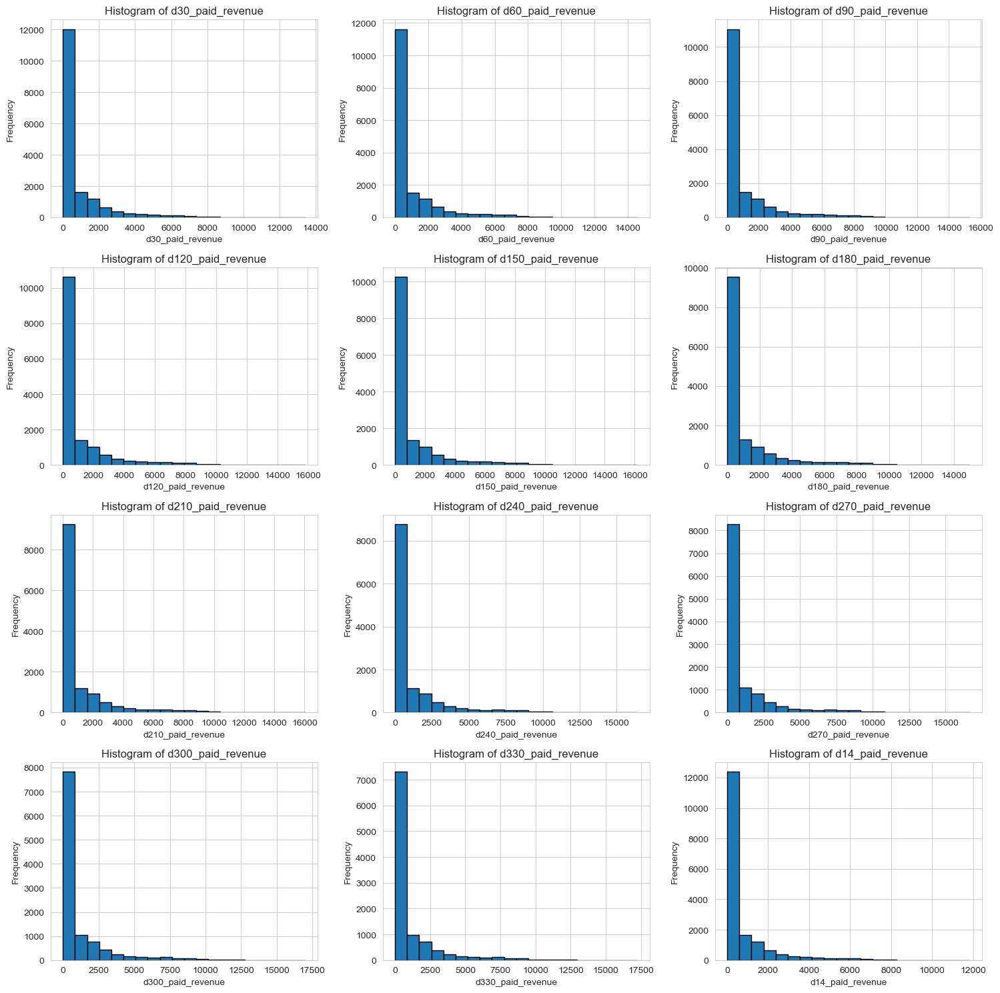

In [200]:
fig, axs = plt.subplots(4, 3, figsize=(15, 15)) # Define a grid of 4x3 subplots
axs = axs.ravel() # Flatten the grid into a 1D array to easily iterate over

for i, c in enumerate(range(2, 14)): # Modify the range to fit 12 plots
  if i == 11:
    axs[i].hist(train_datasets['d30_paid_revenue']['d14_paid_revenue'], bins=20, edgecolor='black')
    axs[i].set_xlabel('d14_paid_revenue')
    axs[i].set_ylabel('Frequency')
    axs[i].set_title('Histogram of d14_paid_revenue')
  else:
    cohort = c * 30
    prev_cohort = (c - 1) * 30
    
    axs[i].hist(train_datasets[f'd{cohort}_paid_revenue'][f'd{prev_cohort}_paid_revenue'], bins=20, edgecolor='black')
    axs[i].set_xlabel(f'd{prev_cohort}_paid_revenue')
    axs[i].set_ylabel('Frequency')
    axs[i].set_title(f'Histogram of d{prev_cohort}_paid_revenue')

plt.tight_layout() # Improve appearance
plt.show() # Show the plot


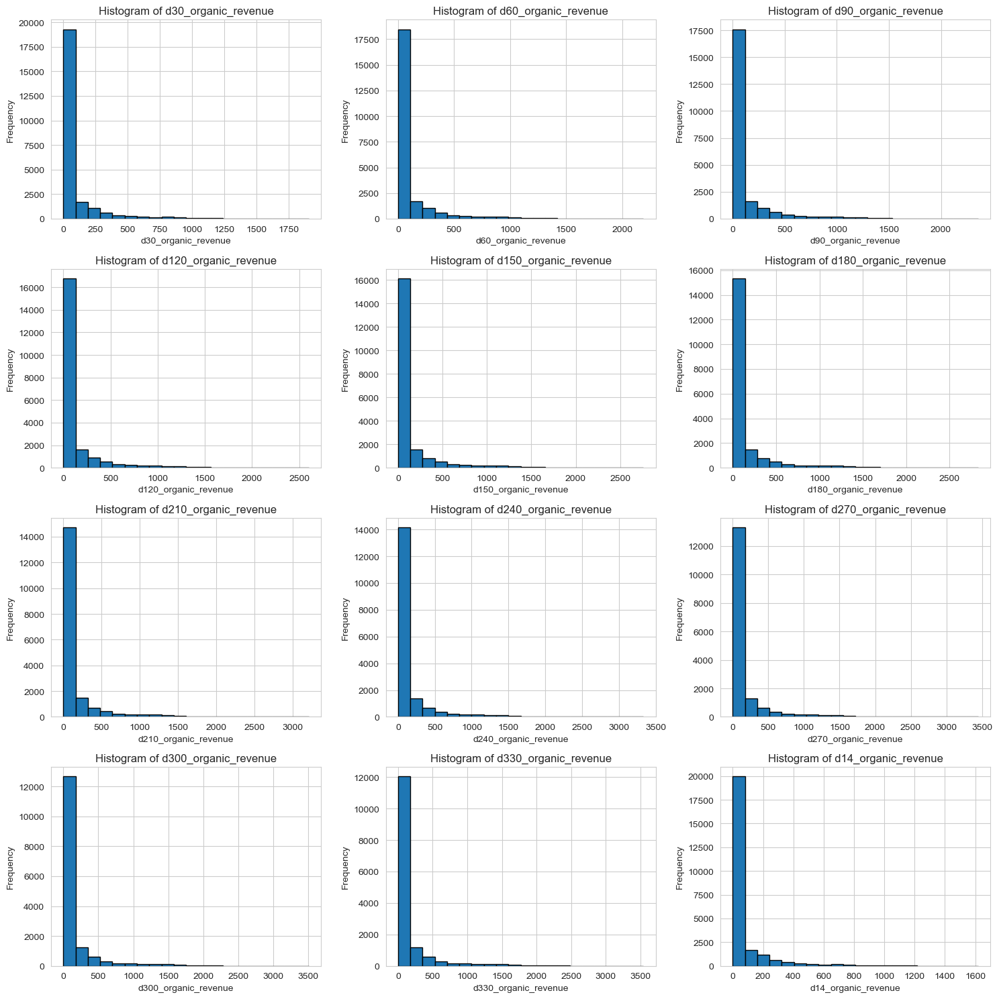

In [201]:
fig, axs = plt.subplots(4, 3, figsize=(15, 15)) # Define a grid of 4x3 subplots
axs = axs.ravel() # Flatten the grid into a 1D array to easily iterate over

for i, c in enumerate(range(2, 14)): # Modify the range to fit 12 plots
  if i == 11:
    axs[i].hist(train_datasets['d30_organic_revenue']['d14_organic_revenue'], bins=20, edgecolor='black')
    axs[i].set_xlabel('d14_organic_revenue')
    axs[i].set_ylabel('Frequency')
    axs[i].set_title('Histogram of d14_organic_revenue')
  else:
    cohort = c * 30
    prev_cohort = (c - 1) * 30
    
    axs[i].hist(train_datasets[f'd{cohort}_organic_revenue'][f'd{prev_cohort}_organic_revenue'], bins=20, edgecolor='black')
    axs[i].set_xlabel(f'd{prev_cohort}_organic_revenue')
    axs[i].set_ylabel('Frequency')
    axs[i].set_title(f'Histogram of d{prev_cohort}_organic_revenue')

plt.tight_layout() # Improve appearance
plt.show() # Show the plot


### Fitting models (w/o growth outliers and duplicates)

In [202]:
models = []
scores = []
rmses = []
maes = []
rounds = []
regressors_2 = {}

for b in buckets:
  for i in range(len(cohorts)):
    if i > 0: 
      cohort = cohorts[i]
      prev_cohort = cohorts[i-1]
      
      train_dataset = f'd{cohort}_{b}_revenue'
      
      label_col = f'd{cohort}_{b}_revenue'
      feature_col = f'd{prev_cohort}_{b}_revenue'

      train_datasets[f'd{cohort}_{b}_revenue'] = train_datasets[f'd{cohort}_{b}_revenue'].drop_duplicates()

      X = train_datasets[f'd{cohort}_{b}_revenue'][dimension_cols + time_dimension_cols + [feature_col]]
      y = train_datasets[f'd{cohort}_{b}_revenue'][[label_col]]
      
      # One-Hot Encoding for dimension_cols
      X = pd.get_dummies(X, columns=dimension_cols)
      
      # print(f'fitting d{cohort}_{b} with {len(X)} records (w/o outliers)...')
      
      # Split the data into a training set and a test set
      X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

      # Define the parameter grid to search over
      param_grid = {
          'fit_intercept': [True, False]
      }
      
      # Create a GridSearchCV instance
      grid_search = GridSearchCV(LinearRegression(), param_grid, cv=5)
      
      # Train the model
      grid_search.fit(X_train, y_train)

      # Get the best model
      best_model = grid_search.best_estimator_

      # Make predictions on the test set
      y_pred = best_model.predict(X_test)

      # Calculate the root mean squared error and the mean absolute error
      rmse = mean_squared_error(y_test, y_pred)
      mae = mean_absolute_error(y_test, y_pred)
      score = best_model.score(X_test, y_test)
      
      models.append(f'd{cohort}_{b}_revenue')
      scores.append(score)
      rmses.append(rmse)
      maes.append(mae)
      rounds.append('second')
      
      regressors_2[f'd{cohort}_{b}'] = best_model

model_results_2 = pd.DataFrame({
  "models": models,
  "scores": scores,
  "rmses": rmses,
  "maes": maes,
  "rounds": rounds
})

model_results_2

,models,scores,rmses,maes,rounds
0,d14_paid_revenue,0.999114,1519.533390,19.510670,second
1,d30_paid_revenue,0.998917,2288.280869,25.338677,second
2,d60_paid_revenue,0.998884,2895.763491,27.479935,second
3,d90_paid_revenue,0.999681,1013.892877,16.712110,second
4,d120_paid_revenue,0.999789,711.706016,13.864826,second
5,d150_paid_revenue,0.999841,538.382961,11.113417,second
6,d180_paid_revenue,0.999899,360.426256,9.417811,second
7,d210_paid_revenue,0.999936,246.591077,8.539811,second
8,d240_paid_revenue,0.999945,211.538533,7.180153,second
9,d270_paid_revenue,0.999959,146.272930,6.032865,second


### Top Performers

In [203]:
model_results = pd.concat([model_results_1, model_results_2], ignore_index=True)

# group by models and get index of max scores
idx = model_results.groupby(['models'])['scores'].idxmax()

# use the index to get corresponding models, scores, and rounds
best_scores = model_results.loc[idx, ['models', 'scores', 'rounds']]

best_scores

,models,scores,rounds
43,d120_organic_revenue,0.999287,second
30,d120_paid_revenue,0.999789,second
39,d14_organic_revenue,0.998601,second
0,d14_paid_revenue,0.999196,first
44,d150_organic_revenue,0.999558,second
31,d150_paid_revenue,0.999841,second
45,d180_organic_revenue,0.999780,second
32,d180_paid_revenue,0.999899,second
46,d210_organic_revenue,0.999869,second
33,d210_paid_revenue,0.999936,second


## Testing Models

In [204]:
roas_report = data.copy()
roas_report['date'] = pd.to_datetime(roas_report['date'])
roas_report['day_of_week'] = roas_report['date'].dt.dayofweek
roas_report['month'] = roas_report['date'].dt.month
roas_report['year'] = roas_report['date'].dt.year
roas_report = roas_report.fillna(0)
roas_report

,date,sku,network_name,region,spend,d0_paid_revenue,d0_organic_revenue,d7_paid_revenue,d7_organic_revenue,d14_paid_revenue,...,d270_organic_revenue,d300_paid_revenue,d300_organic_revenue,d330_paid_revenue,d330_organic_revenue,d360_paid_revenue,d360_organic_revenue,day_of_week,month,year
0,2021-01-09,App T (android),Channel F,T1,8643.714396,3690.80835,651.381650,5932.84372,1209.219720,6555.86748,...,1912.001697,9920.16257,1928.197908,9975.10027,1942.910550,10069.34577,1966.276748,5,1,2021
1,2022-04-06,App T (android),Channel F,Other,458.032503,167.69770,16.234457,275.22140,36.814774,316.85140,...,0.000000,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000,2,4,2022
2,2022-02-23,App T (android),Channel F,T3,529.534628,186.28890,5.182008,268.48480,7.485552,295.22240,...,12.562045,351.02740,12.562045,0.00000,0.000000,0.00000,0.000000,2,2,2022
3,2020-05-10,App T (android),Channel F,T2,288.020000,120.78060,12.869016,195.67806,23.203026,220.78707,...,70.326710,414.20781,72.139378,418.22165,74.169235,419.78115,75.330767,6,5,2020
4,2022-04-27,App T (android),Channel F,T3,121.620458,76.96390,1.642729,137.76170,3.693580,144.49770,...,0.000000,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000,2,4,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27323,2020-06-20,App T (android),Channel G,Other,0.000000,0.00000,0.000190,0.00000,0.000190,0.00000,...,0.000190,0.00000,0.000190,0.00000,0.000192,0.00000,0.000192,5,6,2020
27324,2020-08-27,App T (android),Channel I,T3,0.000000,0.00000,0.049252,0.00000,0.049252,0.00000,...,0.049252,0.00000,0.049252,0.00000,0.049252,0.00000,0.049252,3,8,2020
27325,2020-07-02,App T (android),Channel G,T4,0.000000,0.00000,0.000018,0.00000,0.000018,0.00000,...,0.000028,0.00000,0.000028,0.00000,0.000028,0.00000,0.000028,3,7,2020
27326,2020-08-08,App T (android),Channel G,T4,0.000000,0.00000,0.064551,0.00000,0.064551,0.00000,...,0.064551,0.00000,0.064551,0.00000,0.064551,0.00000,0.064551,5,8,2020


In [205]:
p_roas_report = roas_report.copy()

In [206]:
p_roas_report = roas_report.copy()

pred_roas_report_base_columns = ['network_name','region', 'day_of_week', 'month', 'year']
test_cohorts = [7, 14, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360]

for b in buckets:
  for i in range(len(test_cohorts)):
    if i > 0:
      cohort = cohorts[i]
      prev_cohort = cohorts[i-1]
      
      feature_col = f'd{prev_cohort}_{b}_revenue'
      
      regressor = f'd{cohort}_{b}'
      actual_col = f'd{cohort}_{b}_revenue'
      pred_col = f'd{cohort}_{b}_revenue'
      pred_col_diff = f'd{cohort}_{b}_revenue_diff'
      
      pred_roas_report = p_roas_report[pred_roas_report_base_columns + [feature_col]]

      p_roas_report[pred_col] = None  
      p_roas_report.loc[p_roas_report[feature_col] <= 0, pred_col] = 0
      p_roas_report.loc[p_roas_report[feature_col] > 0, pred_col] = regressors_2[regressor].predict(pd.get_dummies(pred_roas_report.loc[p_roas_report[feature_col] > 0], columns=dimension_cols))



      # p_roas_report[pred_col] = regressors_1[regressor].predict(pd.get_dummies(pred_roas_report, columns=dimension_cols))
      # roas_report[pred_col_diff] = roas_report[pred_col] - roas_report[actual_col]
      
p_roas_report.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27328 entries, 0 to 27327
Data columns (total 38 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   date                  27328 non-null  datetime64[ns]
 1   sku                   27328 non-null  object        
 2   network_name          27328 non-null  object        
 3   region                27328 non-null  object        
 4   spend                 27328 non-null  float64       
 5   d0_paid_revenue       27328 non-null  float64       
 6   d0_organic_revenue    27328 non-null  float64       
 7   d7_paid_revenue       27328 non-null  float64       
 8   d7_organic_revenue    27328 non-null  float64       
 9   d14_paid_revenue      27328 non-null  object        
 10  d14_organic_revenue   27328 non-null  object        
 11  d30_paid_revenue      27328 non-null  object        
 12  d30_organic_revenue   27328 non-null  object        
 13  d60_paid_revenue

In [216]:
import plotly.graph_objects as go
import plotly.io as pio

# Set the default template for a more visually appealing plot
pio.templates.default = "plotly_dark"

# Grouping and data preparation
plot_df = roas_report.groupby('date')['d360_paid_revenue'].sum().reset_index()

plot_df[plot_df['d360_paid_revenue'] == 0] =  None

plot_df2 = p_roas_report.groupby('date')['d360_paid_revenue'].sum().reset_index()

plot_df2[plot_df2['d360_paid_revenue'] == 0] =  None

# Create traces
trace1 = go.Scatter(
    x=plot_df['date'],
    y=plot_df['d360_paid_revenue'],
    # mode='lines+markers',
    name='Actual Revenue',
    line=dict(color='rgb(31, 119, 180)'),
    marker=dict(size=8),
)

trace2 = go.Scatter(
    x=plot_df2['date'],
    y=plot_df2['d360_paid_revenue'],
    # mode='lines+markers',
    name='Predicted Revenue',
    line=dict(color='rgb(255, 127, 14)'),
    marker=dict(size=8),
)

# Create a layout
layout = go.Layout(
    title='D360 Paid Revenue Report (actual vs predicted)',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Paid Revenue'),
    legend=dict(x=0.02, y=0.98),
    margin=dict(l=50, r=20, t=60, b=50),
)

# Create a Figure and add traces to it
fig = go.Figure(data=[trace1, trace2], layout=layout)

# Set the width and height of the plot
fig.update_layout(height=600)

# Show the figure
fig.show()


In [208]:
plot_df2['d360_paid_revenue_diff'] = np.where(plot_df['d360_paid_revenue'] <= 0, 0, plot_df['d360_paid_revenue']-plot_df2['d360_paid_revenue'])
# plot_df2 = plot_df2.query('date < "2022-07-01"')

# Create a trace for 'pred_d14_paid_revenue'
trace = go.Scatter(
    x = plot_df2.index,
    y = plot_df2['d360_paid_revenue_diff'],
    # mode = 'lines+markers',
    name = 'd360_paid_revenue_diff'
)


# Create a Figure and add the traces to it
data = [trace]

layout = go.Layout(title='D360 Revenue Discrepancy Report')

fig = go.Figure(data=data, layout=layout)

# Set the width and height of the plot
fig.update_layout(height=900)

# Show the figure
fig.show()


In [217]:
import plotly.graph_objects as go
import plotly.io as pio

# Set the default template for a more visually appealing plot
pio.templates.default = "plotly_dark"

# Grouping and data preparation
plot_df = roas_report.groupby('date')['d360_organic_revenue'].sum().reset_index()
plot_df[plot_df['d360_organic_revenue'] == 0] =  None

plot_df2 = p_roas_report.groupby('date')['d360_organic_revenue'].sum().reset_index()
plot_df2[plot_df2['d360_organic_revenue'] == 0] =  None

# Create traces
trace1 = go.Scatter(
    x=plot_df['date'],
    y=plot_df['d360_organic_revenue'],
    # mode='lines+markers',
    name='Actual Revenue',
    line=dict(color='rgb(31, 119, 180)'),
    marker=dict(size=8),
)

trace2 = go.Scatter(
    x=plot_df2['date'],
    y=plot_df2['d360_organic_revenue'],
    # mode='lines+markers',
    name='Predicted Revenue',
    line=dict(color='rgb(255, 127, 14)'),
    marker=dict(size=8),
)

# Create a layout
layout = go.Layout(
    title='D360 Organic Revenue Report (actual vs predicted)',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Organic Revenue'),
    legend=dict(x=0.02, y=0.98),
    margin=dict(l=50, r=20, t=60, b=50),
)

# Create a Figure and add traces to it
fig = go.Figure(data=[trace1, trace2], layout=layout)

# Set the width and height of the plot
fig.update_layout(height=600)

# Show the figure
fig.show()



In [210]:
plot_df2['d360_organic_revenue_diff'] = np.where(plot_df['d360_organic_revenue'] <= 0, 0, plot_df['d360_organic_revenue']-plot_df2['d360_organic_revenue'])
# plot_df2 = plot_df2.query('date < "2022-07-01"')

# Create a trace for 'pred_d14_paid_revenue'
trace = go.Scatter(
    x = plot_df2.index,
    y = plot_df2['d360_organic_revenue_diff'],
    # mode = 'lines+markers',
    name = 'd360_organic_revenue_diff'
)


# Create a Figure and add the traces to it
data = [trace]

layout = go.Layout(title='D360 Organic Revenue Discrepancy Report')

fig = go.Figure(data=data, layout=layout)

# Set the width and height of the plot
fig.update_layout(height=900)

# Show the figure
fig.show()


In [211]:
import numpy as np
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Create a 7x2 grid of subplots
fig = make_subplots(rows=14, cols=2, subplot_titles=[f'{b} Revenue'.title() for b in buckets])

# Limit the iterations to a total of 14 subplots
total_plots = 0

for i in range(len(test_cohorts)):
    for b_index, b in enumerate(buckets):
    
        if total_plots >= 28:
            break
        
        if i > 0:
            cohort = cohorts[i]
            prev_cohort = cohorts[i-1]
            
            actual_col = f'd{cohort}_{b}_revenue'
            
            # plot_df = roas_report[['date', actual_col]].groupby(['date']).sum()
            # plot_df2 = p_roas_report[['date', actual_col]].groupby(['date']).sum()
            
            # plot_df2[f'{actual_col}_diff'] = np.where(plot_df[actual_col] <= 0, None, plot_df[actual_col] - plot_df2[actual_col])
            # plot_df2 = plot_df2.query('date < "2022-07-01"')
            

            # Grouping and data preparation
            plot_df = roas_report.groupby('date')[actual_col].sum().reset_index()
            plot_df[plot_df[actual_col] == 0] =  None

            plot_df2 = p_roas_report.groupby('date')[actual_col].sum().reset_index()
            plot_df2[plot_df2[actual_col] == 0] =  None

            # Create traces
            trace1 = go.Scatter(
                x=plot_df['date'],
                y=plot_df[actual_col],
                # mode='lines+markers',
                name='Actual Revenue',
                line=dict(color='rgb(31, 119, 180)'),
                marker=dict(size=8),
            )

            trace2 = go.Scatter(
                x=plot_df2['date'],
                y=plot_df2[actual_col],
                # mode='lines+markers',
                name='Predicted Revenue',
                line=dict(color='rgb(255, 127, 14)'),
                marker=dict(size=8),
            )
            row_num = total_plots // 2 + 1  # Calculate the row number (1 to 7)
            col_num = total_plots % 2 + 1   # Calculate the column number (1 or 2)
            
            # Add trace to the appropriate subplot''
            fig.add_trace(trace1, row=row_num, col=col_num)
            fig.add_trace(trace2, row=row_num, col=col_num)
            
            # Update subplot title
            fig.update_xaxes(title_text="Date", row=row_num, col=col_num)
            fig.update_yaxes(title_text=f"D{cohort}", row=row_num, col=col_num)
            
            total_plots += 1

# Update layout
fig.update_layout(title="Predicted vs Actual (D14 - D360)", showlegend=False)
fig.update_layout(width=1400, height=2000)  # Adjust dimensions as needed

# Show the figure
fig.show()

In [212]:
import numpy as np
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Create a 7x2 grid of subplots
fig = make_subplots(rows=14, cols=2, subplot_titles=[f'Revenue Bucket {b}' for b in buckets])

# Limit the iterations to a total of 14 subplots
total_plots = 0


for i in range(len(test_cohorts)):
    for b_index, b in enumerate(buckets):
        
        if total_plots >= 28:
            break
        
        if i > 0:
            cohort = cohorts[i]
            prev_cohort = cohorts[i-1]
            
            actual_col = f'd{cohort}_{b}_revenue'
            
            plot_df = roas_report[['date', actual_col]].groupby(['date']).sum()
            plot_df2 = p_roas_report[['date', actual_col]].groupby(['date']).sum()
            
            plot_df2[f'{actual_col}_diff'] = np.where(plot_df[actual_col] <= 0, None, plot_df[actual_col] - plot_df2[actual_col])
            # plot_df2 = plot_df2.query('date < "2022-07-01"')
            
            # Create a trace for 'pred_d14_paid_revenue'
            trace = go.Scatter(
                x=plot_df2.index,
                y=plot_df2[f'{actual_col}_diff'],
                mode = 'markers',
                name=f'{actual_col}_diff'
            )
            
            row_num = total_plots // 2 + 1  # Calculate the row number (1 to 7)
            col_num = total_plots % 2 + 1   # Calculate the column number (1 or 2)
            
            # Add trace to the appropriate subplot
            fig.add_trace(trace, row=row_num, col=col_num)
            
            # Update subplot title
            fig.update_xaxes(title_text="Date", row=row_num, col=col_num)
            fig.update_yaxes(title_text=f'D{cohort}', row=row_num, col=col_num)
            
            total_plots += 1

# Update layout
fig.update_layout(title="Revenue Discrepancy (D14 - D360)", showlegend=False)
fig.update_layout(width=1400, height=2000)  # Adjust dimensions as needed

# Show the figure
fig.show()
